# Machine learning Lab2

We first import everything needed for the lab


In [1]:
from cvxopt.solvers import qp
from cvxopt.base import matrix
import numpy, pylab , random , math , random

In [238]:
def dotproduct(x,y):
    if(len(x) != len(y)):
        return 0
    return sum(i[0]*i[1] for i in zip(x,y))

def linearKernel(x,y):
    return (numpy.dot(x,y)+1)

def targetClass(classA,classB,data):
    if(data in classA):
        return 1.0
    elif(data in classB):
        return -1.0
    else:
        return 0

def p(data):
    n=len(data)
    p=[]
    for i in range(len(data)):
        p.append([])
        for j in range(len(data)):
            #p[i].append(data[i][2]*data[j][2]*linearKernel(data[i][:2],data[j][:2]))
            p[i].append(linearKernel(data[i][:2],data[j][:2]))
    return p
def q(n):
    return [-1.0 for _ in range(n)]
def h(n):
    return [0.0 for _ in range(n)]
def g(n):
    g=[]
    for i in range(n):
        g.append([])
        for j in range(n):
            g[i].append(0)
        g[i][i]=float(-1)
    return g
def generateData():
    #Uncommentthelinebelowtogenerate
    #thesamedatasetoverandoveragain.
    numpy.random.seed(100)
    classA=[(random.normalvariate(-1.5,1),
            random.normalvariate(0.5,1),
            1.0)
            for i in range(5)] +\
            [(random.normalvariate(1.5,1),
            random.normalvariate(0.5,1),
            1.0)
            for i in range(5)]
    classB=[(random.normalvariate(0.0,0.5),
            random.normalvariate(-0.5,0.5),
            -1.0)
    for i in range(10)]
    data=classA+classB
    random.shuffle(data)
    return data,classA,classB
    
def plot():
    xrange=numpy.arange(-4,4,0.05)
    yrange=numpy.arange(-4,4,0.05)
    grid=matrix([[indicator(x,y) for y in yrange] for x in xrange])

    pylab.contour(xrange,yrange,grid,
                  (-1.0,0.0,1.0),
                  colors=('red','black','blue'),
                  linewidths=(1,3,1))

def Alpha(data):
    #classA,classB,data=generateData()
    r=qp(matrix(p(data)), matrix(q(len(data))), matrix(g(len(data))), matrix(h(len(data))))
    alpha = list(r['x'])
    return alpha

def indicator(point):
    data=generateData()[0]
    alpha=Alpha(data)
    nonzeros=removez(data,alpha)
    val=0
    for u in nonzeros:
        val+=alpha[u]*data[u][2]*linearKernel(point,data[u][:2])
    return val

def removez(data,alpha=0):
    #classA,classB,data=generateData()
    if (alpha==0):
        r=qp(matrix(p(data)), matrix(q(len(data))), matrix(g(len(data))), matrix(h(len(data))))
        alpha = list(r['x'])
    
    
    fullist=[]
    nonzeros=[]
    for u in range(len(alpha)):
        if (alpha[u]>0.00001):
            nonzeros.append(u)
            t=[alpha[u],data[u]]
            #fullist.append(t)
    return nonzeros




In [240]:
data=generateData()[0]
indicator(data[1][:2])


     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1572e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1572e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.


-0.29346323152687548

In [152]:
(1,1)

(1, 1)

In [216]:
data=generateData()
r=qp(matrix(p(data)), matrix(q(len(data))), matrix(g(len(data))), matrix(h(len(data))))

alpha = list(r['x'])
print(alpha)

ValueError: shapes (2,3) and (2,3) not aligned: 3 (dim 1) != 2 (dim 0)

In [144]:
import pylab

In [ ]:
pylab.hold(True)

In [ ]:
classA,classB,data=generateData()

In [ ]:
pylab.plot([p[0] for p in classA],
            [p[1] for p in classA],
            'bo')

In [ ]:
pylab.plot([p[0] for p in classB],
            [p[1] for p in classB],
            'ro')

In [ ]:
pylab.show()

In [241]:
xrange=numpy.arange(-4,4,0.05)
yrange=numpy.arange(-4,4,0.05)
grid=matrix([[indicator([x,y])
            for y in yrange]
            for x in xrange])
pylab.contour(xrange,yrange,grid,
            (-1.0,0.0,1.0),
            colors=('red','black','blue'),
            linewidths=(1,3,1))

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1310e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1310e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1076e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4699e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2035e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4699e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2035e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1270e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1704e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1704e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1789e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4703e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1872e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1410e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1410e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4699e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1470e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1178e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1178e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1636e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1270e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1270e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1304e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9752e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9952e-01 -5.3206e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0036e-01  4e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9752e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9952e-01 -5.3206e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0036e-01  4e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9870e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1455e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1455e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4780e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1537e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4780e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4548e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1114e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1177e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1177e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1401e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1401e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4710e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1805e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1191e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1046e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1046e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1246e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1246e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4555e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1137e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1440e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1519e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1519e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1203e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1533e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4882e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2669e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4882e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2669e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -1.5725e-01 -1.6746e+00  2e+00  1e-02  3e-03
 2: -4.8831e-01 -6.6235e-01  2e-01  8e-17  3e-16
 3: -4.9999e-01 -5.0415e-01  4e-03  4e-17  1e-16
 4: -5.0000e-01 -5.0004e-01  4e-05  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  4e-07  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1274e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1274e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4541e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1792e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1223e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1223e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1071e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1349e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1349e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2360e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2360e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2003e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1267e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1267e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1259e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1124e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1124e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4736e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1506e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1726e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1269e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1269e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1830e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9988e-01 -5.1620e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4689e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1719e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4689e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1719e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4641e+00  2e+01  4e+00  1e+00
 1: -1.6074e-01 -1.6758e+00  2e+00  3e-02  8e-03


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9761e-01 -1.4662e+00  2e+01  5e+00  1e+00
 1: -1.6380e-01 -1.6576e+00  2e+00  3e-02  6e-03
 2: -4.8617e-01 -6.6675e-01  2e-01  8e-17  3e-16
 3: -4.9987e-01 -5.1208e-01  1e-02  6e-17  2e-16
 4: -5.0000e-01 -5.0012e-01  1e-04  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9761e-01 -1.4662e+00  2e+01  5e+00  1e+00
 1: -1.6380e-01 -1.6576e+00  2e+00  3e-02  6e-03
 2: -4.8617e-01 -6.6675e-01  2e-01  8e-17  3e-16
 3: -4.9987e-01 -5.1208e-01  1e-02  6e-17  2e-16
 4: -5.0000e-01 -5.0012e-01  1e-04  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4565e+00  1e+00  0e+00  1e+00


 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1057e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1057e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4528e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1025e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1320e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9864e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1584e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1584e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1981e-01  2e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4706e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1378e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1378e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1444e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1032e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1032e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1444e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1412e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1412e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1321e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1321e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1440e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1270e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1577e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1577e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1492e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1492e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1298e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4656e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1553e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2138e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2138e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4539e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1056e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4539e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1056e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1411e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1385e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1290e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4741e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1801e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4741e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1801e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1740e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1458e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1458e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


 0: -4.9866e-01 -1.4672e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1554e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4739e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1609e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4739e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1609e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4555e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4728e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2057e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4737e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1969e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4737e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1969e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1060e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1060e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1123e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1340e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1340e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4755e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1769e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1470e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9825e-01 -1.4726e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2463e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9825e-01 -1.4726e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2463e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1500e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9817e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2151e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1300e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1300e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1315e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1643e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1643e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1447e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1447e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4797e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1764e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4775e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2035e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9587e-01 -1.4682e+00  2e+01  5e+00  1e+00
 1: -1.5618e-01 -1.6462e+00  2e+00  5e-03  1e-03
 2: -4.8580e-01 -6.4851e-01  2e-01  7e-17  3e-16
 3: -4.9960e-01 -5.1606e-01  2e-02  7e-17  2e-16
 4: -5.0000e-01 -5.0021e-01  2e-04  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  4e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  9e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9587e-01 -1.4682e+00  2e+01  5e+00  1e+00
 1: -1.5618e-01 -1.6462e+00  2e+00  5e-03  1e-03
 2: -4.8580e-01 -6.4851e-01  2e-01  7e-17  3e-16
 3: -4.9960e-01 -5.1606e-01  2e-02  7e-17  2e-16
 4: -5.0000e-01 -5.0021e

 1: -4.9990e-01 -5.1243e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1243e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4525e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1036e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4525e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1036e-01  1e-02  4e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1299e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1211e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1211e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4713e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1628e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4713e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1628e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1322e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9879e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1401e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1401e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1200e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4636e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1528e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1528e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9755e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9951e-01 -5.3093e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0035e-01  4e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1173e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1173e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1556e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1762e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1762e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4692e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1909e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1329e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1106e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1106e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1819e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1819e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1220e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1557e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1557e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1260e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  8e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1260e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  8e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1422e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost   

 1: -4.9990e-01 -5.1485e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1485e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4534e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1068e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4534e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1068e-01  1e-02  4e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1073e-01  1e-02  6e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1222e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1222e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1312e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9812e-01 -1.4736e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2208e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9812e-01 -1.4736e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2208e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1248e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1248e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1352e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08


 0: -4.9874e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1191e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1100e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1100e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4555e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1281e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1464e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1464e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1185e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1185e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1116e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1098e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  2e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1098e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  2e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1391e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1920e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1313e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1313e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1613e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1734e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1734e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9710e-01 -1.4721e+00  2e+01  4e+00  1e+00
 1: -1.5200e-01 -1.6659e+00  2e+00  7e-16  3e-16
 2: -4.8825e-01 -6.4995e-01  2e-01  9e-17  3e-16
 3: -4.9989e-01 -5.1069e-01  1e-02  3e-17  2e-16
 4: -5.0000e-01 -5.0011e-01  1e-04  6e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  7e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9710e-01 -1.4721e+00  2e+01  4e+00  1e+00
 1: -1.5200e-01 -1.6659e+00  2e+00  7e-16  3e-16
 2: -4.8825e-01 -6.4995e-01  2e-01  9e-17  3e-16
 3: -4.9989e-01 -5.1069e-01  1e-02  3e-17  2e-16
 4: -5.0000e-01 -5.0011e-01  1e-04  6e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  7e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1524e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e

     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1456e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1456e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1363e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1503e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1309e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1309e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1182e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1182e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1419e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1412e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1412e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1125e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1125e-01  1e-02  4e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1164e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1478e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1478e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9884e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1120e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1120e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1398e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4663e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1199e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1057e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1057e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -4.8852e-01 -6.5283e-01  2e-01  7e-17  2e-16
 3: -4.9994e-01 -5.0823e-01  8e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0009e-01  9e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  9e-07  6e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  9e-09  3e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1093e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1093e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4568e+00  1e+00  0e+00  1e+00


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1301e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1230e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1230e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2115e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2115e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1643e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9983e-01 -5.1735e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  7e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  2e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1735e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  7e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  2e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1513e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1513e-01  2e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1740e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1720e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1720e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1408e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1408e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9817e-01 -1.4759e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2367e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1051e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1051e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9811e-01 -1.4668e+00  2e+01  4e+00  1e+00
 1: -1.4991e-01 -1.6795e+00  2e+00  6e-16  3e-16
 2: -4.8885e-01 -6.5259e-01  2e-01  5e-17  2e-16


     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1472e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1472e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1215e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4688e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1321e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4688e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1321e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4782e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1910e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1522e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1522e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9776e-01 -1.4574e+00  2e+01  5e+00  1e+00
 1: -1.8086e-01 -1.6459e+00  2e+00  8e-02  2e-02
 2: -4.8032e-01 -7.0075e-01  2e-01  5e-17  2e-16
 3: -4.9984e-01 -5.1251e-01  1e-02  4e-17  1e-16
 4: -5.0000e-01 -5.0013e-01  1e-04  8e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-16
 6: -5.0000e-01 -5.0000e

 1: -4.9983e-01 -5.2304e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2253e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2253e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1182e-01  1e-02  3e-17  3e-02


 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1514e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1524e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1524e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1732e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1484e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1484e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1190e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1190e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1556e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06


 0: -4.9839e-01 -1.4700e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2295e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4700e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2295e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4744e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1952e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4744e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1081e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1692e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1692e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1577e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1577e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4755e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2303e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1155e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1562e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1562e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1106e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4548e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1056e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4548e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1056e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1284e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2027e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2027e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.1881e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1187e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1187e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1321e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04


 0: -4.9877e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1344e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2158e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2158e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4619e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4743e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2085e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1146e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1146e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1070e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1374e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1374e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1555e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1305e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1305e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4800e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2521e-01  3e-02  4e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1530e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1290e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1290e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4786e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1587e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4786e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1587e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1418e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4516e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0994e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4516e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0994e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9749e-01 -1.4735e+00  2e+01  4e+00  1e+00
 1: -1.5453e-01 -1.6658e+00  2e+00  7e-16  2e-16
 2: -4.8908e-01 -6.5047e-01  2e-01  7e-17  2e-16
 3: -4.9997e-01 -5.0599e-01  6e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  7e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  3e-17  2e-16
 6: -5.0000e-01 -5.0000e

 1: -4.9988e-01 -5.1821e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1552e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1552e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1586e-01  2e-02  5e-17  3e-02


 0: -4.9870e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1399e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1399e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1118e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  6e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4612e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1324e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1324e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1354e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1354e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4934e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1871e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1070e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1070e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9819e-01 -1.4841e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2031e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1471e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1471e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1077e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1623e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4712e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1356e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4712e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1356e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1482e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1482e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1150e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1682e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1173e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1173e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1276e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1276e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1646e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1646e-01  2e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1408e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4823e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2594e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  8e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  2e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4823e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2594e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  8e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  2e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1755e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1755e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4779e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2857e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0031e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1586e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1555e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1555e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.4604e+00  2e+01  5e+00  1e+00
 1: -1.6024e-01 -1.6709e+00  2e+00  3e-02  8e-03
 2: -4.8550e-01 -6.7370e-01  2e-01  6e-17  3e-16
 3: -4.9986e-01 -5.1089e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0013e-01  1e-04  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.4604e+00  2e+01  5e+00  1e+00
 1: -1.6024e-01 -1.6709e+00  2e+00  3e-02  8e-03
 2: -4.8550e-01 -6.7370e-01  2e-01  6e-17  3e-16
 3: -4.9986e-01 -5.1089e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0013e-01  1e-04  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  1e-16
Optimal solution found.

 0: -4.9862e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1628e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4797e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2231e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4797e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2231e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4763e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1288e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1288e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1088e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4736e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1778e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1223e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1223e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04


 1: -4.9991e-01 -5.1227e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9815e-01 -1.4631e+00  2e+01  4e+00  1e+00
 1: -1.5705e-01 -1.6702e+00  2e+00  1e-02  3e-03
 2: -4.8817e-01 -6.5909e-01  2e-01  6e-17  2e-16
 3: -4.9996e-01 -5.0596e-01  6e-03  4e-17  2e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9815e-01 -1.4631e+00  2e+01  4e+00  1e+00
 1: -1.5705e-01 -1.6702e+00  2e+00  1e-02  3e-03
 2: -4.8817e-01 -6.5909e-01  2e-01  6e-17  2e-16
 3: -4.9996e-01 -5.0596e-01  6e-03  4e-17  2e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1346e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1346e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1184e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4752e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1512e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4769e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2138e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4769e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2138e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4700e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1522e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1119e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1119e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9982e-01 -5.2182e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2182e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9623e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9952e-01 -5.3297e-01  3e-02  5e-17  6e-02
 2: -5.0000e-01 -5.0037e-01  4e-04  4e-17  6e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  1e-16  6e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  6e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9623e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9952e-01 -5.3297e-01  3e-02  5e-17  6e-02


 1: -4.9990e-01 -5.1459e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1459e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1121e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1121e-01  1e-02  3e-17  2e-02


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1060e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4555e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1049e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4555e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1049e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost   

 2: -4.8933e-01 -6.5015e-01  2e-01  1e-16  3e-16
 3: -4.9998e-01 -5.0466e-01  5e-03  6e-17  1e-16
 4: -5.0000e-01 -5.0005e-01  5e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  5e-07  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1140e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1140e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4536e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1056e-01  1e-02  4e-17  2e-02


 1: -4.9991e-01 -5.1090e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1475e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1475e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1528e-01  2e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9689e-01 -1.4629e+00  2e+01  5e+00  1e+00
 1: -1.6228e-01 -1.6425e+00  1e+00  4e-16  2e-16
 2: -4.8873e-01 -6.4579e-01  2e-01  8e-17  3e-16
 3: -4.9992e-01 -5.0852e-01  9e-03  6e-17  1e-16
 4: -5.0000e-01 -5.0009e-01  9e-05  4e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  9e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  9e-09  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9815e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2249e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9815e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2249e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e

 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1700e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1700e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4758e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1150e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1229e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1106e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1106e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1626e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1626e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4745e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1553e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1443e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1443e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1123e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9832e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2127e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9832e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2127e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1118e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04


 1: -4.9990e-01 -5.1516e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1613e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1613e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1191e-01  1e-02  5e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9789e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9972e-01 -5.2382e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


 0: -4.9862e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1341e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1341e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1303e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4594e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1743e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1386e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1386e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4739e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2172e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4548e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1082e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4548e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1082e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1687e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  8e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1095e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4705e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2155e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4705e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2155e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1345e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1345e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1073e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1073e-01  1e-02  3e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9705e-01 -1.4797e+00  2e+01  5e+00  1e+00
 1: -1.4832e-01 -1.6798e+00  2e+00  1e-02  3e-03
 2: -4.8637e-01 -6.6218e-01  2e-01  7e-17  2e-16
 3: -4.9988e-01 -5.1018e-01  1e-02  5e-17  1e-16
 4: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9705e-01 -1.4797e+00  2e+01  5e+00  1e+00
 1: -1.4832e-01 -1.6798e+00  2e+00  1e-02  3e-03
 2: -4.8637e-01 -6.6218e-01  2e-01  7e-17  2e-16
 3: -4.9988e-01 -5.1018e-01  1e-02  5e-17  1e-16
 4: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1523e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e

     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1909e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9690e-01 -1.4836e+00  1e+00  0e+00  1e+00
 1: -4.9936e-01 -5.3925e-01  4e-02  5e-17  6e-02
 2: -5.0000e-01 -5.0054e-01  5e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0001e-01  5e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  5e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9690e-01 -1.4836e+00  1e+00  0e+00  1e+00
 1: -4.9936e-01 -5.3925e-01  4e-02  5e-17  6e-02
 2: -5.0000e-01 -5.0054e-01  5e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0001e-01  5e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  5e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2256e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2256e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1053e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4868e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2668e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1548e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1548e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9775e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2584e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9965e-01 -5.2442e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0033e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9965e-01 -5.2442e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0033e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1456e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1456e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9823e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1909e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1223e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4527e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1009e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4527e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1009e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2321e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2321e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1144e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9988e-01 -5.1591e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1061e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1061e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1058e-01  1e-02  4e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1248e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1522e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1522e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9807e-01 -1.4730e+00  2e+01  4e+00  1e+00
 1: -1.4622e-01 -1.6875e+00  2e+00  6e-16  3e-16
 2: -4.8877e-01 -6.5416e-01  2e-01  5e-17  2e-16
 3: -4.9995e-01 -5.0744e-01  7e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0008e-01  8e-05  6e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  8e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  8e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9807e-01 -1.4730e+00  2e+01  4e+00  1e+00
 1: -1.4622e-01 -1.6875e+00  2e+00  6e-16  3e-16
 2: -4.8877e-01 -6.5416e-01  2e-01  5e-17  2e-16
 3: -4.9995e-01 -5.0744e-01  7e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0008e-01  8e-05  6e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  8e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  8e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4590e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1308e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1308e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1404e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9830e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2047e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9830e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2047e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1826e-01  2e-02  4e-17  3e-02


 1: -4.9991e-01 -5.1204e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1204e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1643e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1643e-01  2e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1548e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9819e-01 -1.4558e+00  2e+01  4e+00  1e+00
 1: -1.6287e-01 -1.6537e+00  1e+00  6e-16  1e-16
 2: -4.8994e-01 -6.4837e-01  2e-01  6e-17  3e-16
 3: -4.9999e-01 -5.0348e-01  3e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0004e-01  4e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  4e-07  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9819e-01 -1.4558e+00  2e+01  4e+00  1e+00
 1: -1.6287e-01 -1.6537e+00  1e+00  6e-16  1e-16
 2: -4.8994e-01 -6.4837e-01  2e-01  6e-17  3e-16
 3: -4.9999e-01 -5.0348e-01  3e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0004e-01  4e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4530e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1027e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4530e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1027e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1192e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9877e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1487e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4674e+00  1e+00  0e+00  1e+00


 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1277e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1277e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1695e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06


 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1148e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1148e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1473e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04


 1: -4.9990e-01 -5.1490e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1480e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1480e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1940e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1940e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1287e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1153e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1585e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1585e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9877e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1663e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1663e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1233e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4673e+00  1e+00  0e+00  1e+00


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4828e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2285e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1932e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1932e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1509e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1509e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1314e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 0: -4.9851e-01 -1.4746e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1894e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1515e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1515e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4771e+00  1e+00  0e+00  1e+00


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1157e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1157e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1167e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1361e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1415e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1415e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1067e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1545e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1545e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1286e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1303e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1303e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  7e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1203e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1203e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9832e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1968e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1979e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1979e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1729e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1568e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4723e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1568e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1290e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1290e-01  1e-02  5e-17  3e-02


 0: -4.9856e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1386e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1386e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1687e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4653e+00  1e+00  0e+00  1e+00


 0: -4.9705e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9940e-01 -5.3447e-01  4e-02  8e-17  5e-02
 2: -5.0000e-01 -5.0038e-01  4e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9705e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9940e-01 -5.3447e-01  4e-02  8e-17  5e-02
 2: -5.0000e-01 -5.0038e-01  4e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4656e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1674e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4656e+00  1e+00  0e+00  1e+00


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1352e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1239e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1239e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost   

 1: -4.9991e-01 -5.1326e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1326e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1276e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1276e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1361e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4542e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1039e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4542e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1039e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1127e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1127e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1252e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1510e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1510e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1079e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1335e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1538e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1538e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1219e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1219e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4732e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1954e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9477e-01 -1.4435e+00  2e+01  5e+00  1e+00
 1: -1.9915e-01 -1.5829e+00  2e+00  1e-01  2e-02
 2: -4.7015e-01 -6.9429e-01  2e-01  6e-17  3e-16
 3: -4.9789e-01 -5.2233e-01  2e-02  4e-17  1e-16
 4: -4.9999e-01 -5.0133e-01  1e-03  4e-17  2e-16
 5: -5.0000e-01 -5.0001e-01  1e-05  3e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  1e-07  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1422e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1422e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9822e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2228e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9822e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2228e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1147e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1584e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1343e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1343e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1165e-01  1e-02  4e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1210e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1315e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1315e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


 2: -4.3287e-01 -8.0253e-01  4e-01  1e-16  2e-16
 3: -4.9175e-01 -5.5496e-01  6e-02  5e-17  2e-16
 4: -4.9991e-01 -5.0531e-01  5e-03  7e-17  2e-16
 5: -5.0000e-01 -5.0007e-01  7e-05  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  7e-07  3e-17  2e-16
 7: -5.0000e-01 -5.0000e-01  7e-09  2e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1034e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1034e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1098e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1098e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1502e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  5e-07  1e-16  2e-16
 5: -5.0000e-01 -5.0000e-01  5e-09  7e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9281e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9645e-01 -5.4943e-01  5e-02  6e-17  8e-02
 2: -4.9998e-01 -5.0465e-01  5e-03  6e-17  1e-16
 3: -5.0000e-01 -5.0005e-01  5e-05  9e-17  1e-16
 4: -5.0000e-01 -5.0000e-01  5e-07  1e-16  2e-16
 5: -5.0000e-01 -5.0000e-01  5e-09  7e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04


 1: -4.9987e-01 -5.1927e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4890e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1927e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1526e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1526e-01  2e-02  3e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1139e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4923e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2156e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4923e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2156e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06


     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1596e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1596e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1200e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1513e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9796e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9971e-01 -5.2357e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9796e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9971e-01 -5.2357e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1178e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1178e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1178e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1389e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1275e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1275e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1371e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1371e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9822e-01 -1.4564e+00  2e+01  4e+00  1e+00
 1: -1.6636e-01 -1.6547e+00  2e+00  2e-02  5e-03
 2: -4.8769e-01 -6.6209e-01  2e-01  7e-17  2e-16
 3: -4.9994e-01 -5.0769e-01  8e-03  4e-17  1e-16


     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1586e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1586e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1232e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1213e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1352e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9831e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2135e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9831e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2135e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1819e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1440e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1440e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


 1: -4.9991e-01 -5.1040e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1040e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1259e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1259e-01  1e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1353e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1353e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1428e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1305e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1082e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1082e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9877e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1391e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4775e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2523e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4775e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2523e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9830e-01 -1.4691e+00  1e+00  0e+00  1e+00


 0: -4.9843e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1599e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1599e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2119e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4644e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1722e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1722e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1896e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1131e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1131e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1212e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4747e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2048e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4747e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2048e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1819e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1728e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1728e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9779e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9958e-01 -5.2868e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0037e-01  4e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2258e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  2e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2258e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  2e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9693e-01 -1.4545e+00  2e+01  5e+00  1e+00
 1: -1.7351e-01 -1.6345e+00  2e+00  4e-02  1e-02
 2: -4.8253e-01 -6.7151e-01  2e-01  5e-17  2e-16
 3: -4.9934e-01 -5.1822e-01  2e-02  5e-17  1e-16
 4: -5.0000e-01 -5.0038e-01  4e-04  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  4e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e

 1: -4.9991e-01 -5.1274e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9762e-01 -1.4667e+00  2e+01  4e+00  1e+00
 1: -1.5010e-01 -1.6741e+00  2e+00  7e-16  2e-16
 2: -4.8837e-01 -6.5137e-01  2e-01  7e-17  3e-16
 3: -4.9989e-01 -5.0971e-01  1e-02  4e-17  1e-16
 4: -5.0000e-01 -5.0011e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9762e-01 -1.4667e+00  2e+01  4e+00  1e+00
 1: -1.5010e-01 -1.6741e+00  2e+00  7e-16  2e-16
 2: -4.8837e-01 -6.5137e-01  2e-01  7e-17  3e-16
 3: -4.9989e-01 -5.0971e-01  1e-02  4e-17  1e-16
 4: -5.0000e-01 -5.0011e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-16
 6: -5.0000e-01 -5.0000

     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1559e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1559e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1483e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2007e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1987e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1987e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1501e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1501e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4540e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1063e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1372e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1426e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1426e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1302e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1302e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4682e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2098e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1325e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1261e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1261e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08


 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1219e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1219e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1584e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1309e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1309e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1494e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1494e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9825e-01 -1.4868e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2670e-01  3e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1433e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1433e-01  1e-02  4e-17  3e-02


 1: -4.9984e-01 -5.2165e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  8e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.4918e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2165e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  8e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1421e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1421e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1332e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1332e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1279e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4543e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1056e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1305e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1305e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4851e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1885e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4851e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1885e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1557e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06


 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1717e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1443e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1443e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1544e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1770e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1770e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9988e-01 -5.1635e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4784e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1635e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1162e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1162e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1129e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1171e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1592e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1592e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4730e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1842e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4732e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2188e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4732e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2188e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1472e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1472e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9741e-01 -1.4644e+00  2e+01  4e+00  1e+00
 1: -1.5731e-01 -1.6573e+00  1e+00  7e-16  2e-16
 2: -4.8850e-01 -6.4821e-01  2e-01  8e-17  3e-16
 3: -4.9983e-01 -5.0888e-01  9e-03  6e-17  2e-16


     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1023e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1315e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1500e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1500e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0008e-01  8e-05  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  8e-07  3e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  8e-09  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9670e-01 -1.4882e+00  2e+01  5e+00  1e+00
 1: -1.4215e-01 -1.6847e+00  2e+00  8e-16  2e-16
 2: -4.8798e-01 -6.5396e-01  2e-01  5e-17  3e-16
 3: -4.9995e-01 -5.0804e-01  8e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0008e-01  8e-05  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  8e-07  3e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  8e-09  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1468e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4629e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4818e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2478e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1371e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1371e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -1.4719e-01 -1.6799e+00  2e+00  7e-16  2e-16
 2: -4.8823e-01 -6.5245e-01  2e-01  7e-17  2e-16
 3: -4.9989e-01 -5.1054e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0011e-01  1e-04  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9755e-01 -1.4724e+00  2e+01  4e+00  1e+00
 1: -1.4719e-01 -1.6799e+00  2e+00  7e-16  2e-16
 2: -4.8823e-01 -6.5245e-01  2e-01  7e-17  2e-16
 3: -4.9989e-01 -5.1054e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0011e-01  1e-04  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1272e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000

 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1270e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1270e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1956e-01  2e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1956e-01  2e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1970e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1223e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1436e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1436e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1053e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1053e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1216e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1135e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1788e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1788e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9790e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2263e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1218e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1218e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1844e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1365e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1365e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1415e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1415e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1977e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 5: -5.0000e-01 -5.0000e-01  2e-06  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1474e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1474e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1071e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06


 1: -4.9990e-01 -5.1418e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1205e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1205e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1960e-01  2e-02  4e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1197e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1119e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1119e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06


 1: -4.9991e-01 -5.1183e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1631e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1631e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1248e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1582e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1246e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1246e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9832e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1990e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1199e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1199e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9868e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1425e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9794e-01 -1.4583e+00  2e+01  4e+00  1e+00
 1: -1.7071e-01 -1.6483e+00  2e+00  3e-02  7e-03
 2: -4.8656e-01 -6.6867e-01  2e-01  9e-17  2e-16
 3: -4.9996e-01 -5.0635e-01  6e-03  6e-17  2e-16
 4: -5.0000e-01 -5.0007e-01  7e-05  3e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  7e-07  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  7e-09  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9794e-01 -1.4583e+00  2e+01  4e+00  1e+00
 1: -1.7071e-01 -1.6483e+00  2e+00  3e-02  7e-03
 2: -4.8656e-01 -6.6867e-01  2e-01  9e-17  2e-16
 3: -4.9996e-01 -5.0635e-01  6e-03  6e-17  2e-16
 4: -5.0000e-01 -5.0007e-01  7e-05  3e-17  2e-16
 5: -5.0000e-01 -5.0000

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1151e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1151e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1427e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2152e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1838e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1838e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1287e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1529e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1176e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1176e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1503e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1503e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2254e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4703e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1791e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4703e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1791e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1265e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9830e-01 -1.4572e+00  2e+01  4e+00  1e+00
 1: -1.6178e-01 -1.6578e+00  2e+00  1e-03  3e-04
 2: -4.8983e-01 -6.5010e-01  2e-01  7e-17  3e-16
 3: -4.9999e-01 -5.0350e-01  4e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0004e-01  4e-05  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  4e-07  3e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9830e-01 -1.4572e+00  2e+01  4e+00  1e+00
 1: -1.6178e-01 -1.6578e+00  2e+00  1e-03  3e-04
 2: -4.8983e-01 -6.5010e-01  2e-01  7e-17  3e-16
 3: -4.9999e-01 -5.0350e-01  4e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0004e-01  4e-05  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  4e-07  3e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1256e-01  1e-02  4e-17  3e-02


 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  4e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9820e-01 -1.4689e+00  2e+01  4e+00  1e+00
 1: -1.5123e-01 -1.6786e+00  2e+00  7e-16  2e-16
 2: -4.8930e-01 -6.5279e-01  2e-01  8e-17  3e-16
 3: -4.9998e-01 -5.0545e-01  5e-03  4e-17  2e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  4e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4753e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1910e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4753e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1307e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1319e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1319e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1256e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1256e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2268e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1368e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1531e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1531e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1377e-01  1e-02  4e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4742e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2249e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4742e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2249e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4749e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1661e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1343e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4522e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0992e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4522e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0992e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1227e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4739e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1874e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4739e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1874e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9689e-01 -1.4713e+00  2e+01  4e+00  1e+00
 1: -1.5304e-01 -1.6621e+00  2e+00  9e-16  2e-16
 2: -4.8788e-01 -6.4883e-01  2e-01  8e-17  2e-16
 3: -4.9981e-01 -5.1337e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0013e-01  1e-04  6e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  9e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9689e-01 -1.4713e+00  2e+01  4e+00  1e+00
 1: -1.5304e-01 -1.6621e+00  2e+00  9e-16  2e-16
 2: -4.8788e-01 -6.4883e-01  2e-01  8e-17  2e-16
 3: -4.9981e-01 -5.1337e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0013e-01  1e-04  6e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  9e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9828e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1401e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1070e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1070e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1635e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9987e-01 -5.2166e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1736e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1736e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1183e-01  1e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1088e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1563e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1563e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4534e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1036e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4534e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1036e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1693e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1146e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1261e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1261e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1472e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1535e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1535e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1167e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1167e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1338e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4656e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1508e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1102e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1102e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1505e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1610e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1610e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4823e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2416e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4823e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2416e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1166e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1487e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1487e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1570e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1335e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1335e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1164e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9770e-01 -1.4732e+00  1e+00  0e+00  1e+00
 1: -4.9960e-01 -5.2983e-01  3e-02  5e-17  5e-02
 2: -5.0000e-01 -5.0032e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9770e-01 -1.4732e+00  1e+00  0e+00  1e+00
 1: -4.9960e-01 -5.2983e-01  3e-02  5e-17  5e-02
 2: -5.0000e-01 -5.0032e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9625e-01 -1.4473e+00  2e+01  5e+00  1e+00
 1: -1.8721e-01 -1.6284e+00  2e+00  1e-01  3e-02
 2: -4.6545e-01 -7.1962e-01  3e-01  8e-17  3e-16
 3: -4.9507e-01 -5.3412e-01  4e-02  6e-17  2e-16
 4: -4.9988e-01 -5.0403e-01  4e-03  5e-17  2e-16
 5: -5.0000e-01 -5.0007e-01  7e-05  7e-17  1e-16
 6: -5.0000e-01 -5.0000e

 6: -5.0000e-01 -5.0000e-01  6e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9818e-01 -1.4662e+00  2e+01  5e+00  1e+00
 1: -1.6106e-01 -1.6728e+00  2e+00  3e-02  8e-03
 2: -4.8605e-01 -6.7595e-01  2e-01  7e-17  2e-16
 3: -4.9998e-01 -5.0556e-01  6e-03  3e-17  1e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  4e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04


 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1676e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1676e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1147e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1499e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1398e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1398e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1337e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1337e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1014e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1145e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1145e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1301e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9865e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1219e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.1940e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.1940e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4616e+00  1e+00  0e+00  1e+00


 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1860e-01  2e-02  8e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1028e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1028e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04


 1: -4.9990e-01 -5.1389e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1389e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9784e-01 -1.4760e+00  1e+00  0e+00  1e+00
 1: -4.9959e-01 -5.3235e-01  3e-02  5e-17  5e-02
 2: -5.0000e-01 -5.0044e-01  4e-04  3e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  6e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9784e-01 -1.4760e+00  1e+00  0e+00  1e+00
 1: -4.9959e-01 -5.3235e-01  3e-02  5e-17  5e-02


 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9822e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2398e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1134e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1134e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4757e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1707e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1101e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1101e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1716e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4754e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1687e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4754e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1687e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1143e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1143e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1269e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1588e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1588e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4776e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2640e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1489e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1489e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1340e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1174e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1393e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1393e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4781e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2638e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4781e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2638e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1187e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4718e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4718e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1384e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -1.7191e-01 -1.6715e+00  2e+00  9e-02  2e-02
 2: -4.7908e-01 -7.1085e-01  2e-01  8e-17  2e-16
 3: -4.9973e-01 -5.1383e-01  1e-02  5e-17  1e-16
 4: -5.0000e-01 -5.0022e-01  2e-04  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  6e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4582e+00  2e+01  5e+00  1e+00
 1: -1.7191e-01 -1.6715e+00  2e+00  9e-02  2e-02
 2: -4.7908e-01 -7.1085e-01  2e-01  8e-17  2e-16
 3: -4.9973e-01 -5.1383e-01  1e-02  5e-17  1e-16
 4: -5.0000e-01 -5.0022e-01  2e-04  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  6e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1804e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000

 1: -4.9991e-01 -5.1214e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1137e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1137e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1209e-01  1e-02  4e-17  3e-02


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1300e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1300e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1637e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08


 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1460e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1460e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1277e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04


 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1387e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1387e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1887e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1192e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1192e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1271e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1103e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9651e-01 -1.4820e+00  2e+01  5e+00  1e+00
 1: -1.5129e-01 -1.6657e+00  2e+00  6e-16  2e-16
 2: -4.8874e-01 -6.5103e-01  2e-01  8e-17  2e-16
 3: -4.9997e-01 -5.0594e-01  6e-03  7e-17  1e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9651e-01 -1.4820e+00  2e+01  5e+00  1e+00
 1: -1.5129e-01 -1.6657e+00  2e+00  6e-16  2e-16
 2: -4.8874e-01 -6.5103e-01  2e-01  8e-17  2e-16
 3: -4.9997e-01 -5.0594e-01  6e-03  7e-17  1e-16
 4: -5.0000e-01 -5.0006e

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1641e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1641e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1463e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1095e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1095e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1362e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9828e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1617e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1200e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1200e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1149e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4710e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1628e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4710e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1628e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


 0: -4.9887e-01 -1.4528e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0996e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4528e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0996e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1252e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4646e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9773e-01 -1.4574e+00  2e+01  5e+00  1e+00
 1: -1.7626e-01 -1.6459e+00  2e+00  6e-02  1e-02
 2: -4.8283e-01 -6.8668e-01  2e-01  8e-17  3e-16
 3: -4.9986e-01 -5.1151e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0014e-01  1e-04  7e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9773e-01 -1.4574e+00  2e+01  5e+00  1e+00
 1: -1.7626e-01 -1.6459e+00  2e+00  6e-02  1e-02
 2: -4.8283e-01 -6.8668e-01  2e-01  8e-17  3e-16
 3: -4.9986e-01 -5.1151e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0014e-01  1e-04  7e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4746e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1356e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e

 1: -4.9983e-01 -5.1924e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9820e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1924e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4699e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1442e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4699e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1442e-01  1e-02  5e-17  3e-02


 0: -4.9879e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1635e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1399e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1399e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4592e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1812e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1140e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1140e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1466e-01  1e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1466e-01  1e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1502e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4744e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1943e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1468e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1468e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1440e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9820e-01 -1.4541e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1623e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9820e-01 -1.4541e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1623e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4532e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1024e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4532e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1024e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4519e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0996e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  5e-17  2e-04


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1854e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1854e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1322e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1668e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1668e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1589e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1589e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2192e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1328e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1328e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4715e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1971e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04


 0: -4.9876e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1507e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1243e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1243e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4646e+00  1e+00  0e+00  1e+00


 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  7e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9792e-01 -1.4752e+00  1e+00  0e+00  1e+00
 1: -4.9966e-01 -5.3228e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0039e-01  4e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  7e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1212e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1212e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4792e+00  2e+01  4e+00  1e+00
 1: -1.4615e-01 -1.6922e+00  2e+00  5e-16  3e-16
 2: -4.8931e-01 -6.5543e-01  2e-01  7e-17  2e-16
 3: -4.9999e-01 -5.0370e-01  4e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0004e-01  4e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  4e-07  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1612e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1612e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.


     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1406e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1330e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1330e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1055e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1055e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1113e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08


 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9831e-01 -1.4795e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2401e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1734e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1734e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08


 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1129e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1129e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4813e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2218e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04


     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1322e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1310e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1310e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1539e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1539e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1096e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04


     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1515e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4736e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.2051e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4736e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.2051e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1887e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1132e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1132e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


 1: -4.9991e-01 -5.1300e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1590e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1590e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1426e-01  1e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1393e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1393e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1792e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1285e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4696e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1263e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4696e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1263e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  4e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1168e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1168e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1461e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1356e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1194e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1194e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4787e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1907e-01  2e-02  5e-17  3e-02


 1: -4.9989e-01 -5.1482e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4736e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1482e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1612e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1612e-01  2e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4697e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1498e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1189e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1189e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1386e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1345e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1345e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2074e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2074e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1315e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1644e-01  2e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1109e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1109e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9986e-01 -5.1907e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9807e-01 -1.4586e+00  2e+01  5e+00  1e+00
 1: -1.6189e-01 -1.6735e+00  2e+00  5e-02  1e-02
 2: -4.8261e-01 -6.8552e-01  2e-01  5e-17  1e-16
 3: -4.9941e-01 -5.1511e-01  2e-02  4e-17  1e-16
 4: -5.0000e-01 -5.0031e-01  3e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  3e-06  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  3e-08  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9807e-01 -1.4586e+00  2e+01  5e+00  1e+00
 1: -1.6189e-01 -1.6735e+00  2e+00  5e-02  1e-02
 2: -4.8261e-01 -6.8552e-01  2e-01  5e-17  1e-16
 3: -4.9941e-01 -5.1511e-01  2e-02  4e-17  1e-16
 4: -5.0000e-01 -5.0031e-01  3e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  3e-06  5e-17  1e-16
 6: -5.0000e-01 -5.0000

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1513e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1513e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1206e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1291e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1291e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1306e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1306e-01  1e-02  5e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1223e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1043e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1043e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06


     pcost       dcost       gap    pres   dres
 0: -4.9756e-01 -1.4806e+00  2e+01  4e+00  1e+00
 1: -1.5042e-01 -1.6767e+00  2e+00  5e-16  2e-16
 2: -4.8921e-01 -6.5283e-01  2e-01  1e-16  2e-16
 3: -4.9999e-01 -5.0473e-01  5e-03  3e-17  1e-16
 4: -5.0000e-01 -5.0005e-01  5e-05  6e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  5e-07  9e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1382e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1382e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.


     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1632e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1632e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1227e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4545e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1163e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9813e-01 -1.4682e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2425e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9813e-01 -1.4682e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2425e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4701e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1511e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9615e-01 -1.4752e+00  2e+01  5e+00  1e+00
 1: -1.8164e-01 -1.6502e+00  2e+00  1e-01  3e-02
 2: -4.7271e-01 -7.2914e-01  3e-01  6e-17  2e-16
 3: -4.9975e-01 -5.1717e-01  2e-02  6e-17  1e-16
 4: -5.0000e-01 -5.0020e-01  2e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  8e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9615e-01 -1.4752e+00  2e+01  5e+00  1e+00
 1: -1.8164e-01 -1.6502e+00  2e+00  1e-01  3e-02
 2: -4.7271e-01 -7.2914e-01  3e-01  6e-17  2e-16


     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4753e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1501e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1093e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1093e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9862e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1360e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1019e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1019e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9813e-01 -1.4702e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1625e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1591e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1591e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1475e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1475e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2421e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1580e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.5047e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2064e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  7e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.5047e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2064e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  7e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4700e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1671e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1418e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1418e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1517e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1041e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1041e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1367e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1777e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1777e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2094e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1496e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1605e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1605e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9825e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1508e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9825e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1508e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1404e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4612e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1303e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4533e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1007e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4533e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1007e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1257e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1257e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1329e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1178e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1178e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4545e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1024e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1244e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1244e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1387e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1536e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1536e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04


 5: -5.0000e-01 -5.0002e-01  2e-05  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-07  8e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9654e-01 -1.4598e+00  2e+01  5e+00  1e+00
 1: -1.8691e-01 -1.6485e+00  2e+00  2e-01  4e-02
 2: -4.6362e-01 -7.4396e-01  3e-01  1e-16  4e-16
 3: -4.9751e-01 -5.3781e-01  4e-02  6e-17  1e-16
 4: -4.9999e-01 -5.0212e-01  2e-03  3e-17  1e-16
 5: -5.0000e-01 -5.0002e-01  2e-05  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-07  8e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4747e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1564e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4747e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1564e-01  2e-02  5e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1074e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1245e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1245e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1444e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1444e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1322e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1575e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1575e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1343e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4725e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1899e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4557e+00  2e+01  4e+00  1e+00
 1: -1.6548e-01 -1.6650e+00  2e+00  3e-02  8e-03
 2: -4.8644e-01 -6.7435e-01  2e-01  6e-17  2e-16
 3: -4.9998e-01 -5.0501e-01  5e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0005e-01  5e-05  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  5e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  5e-09  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4557e+00  2e+01  4e+00  1e+00
 1: -1.6548e-01 -1.6650e+00  2e+00  3e-02  8e-03
 2: -4.8644e-01 -6.7435e-01  2e-01  6e-17  2e-16
 3: -4.9998e-01 -5.0501e-01  5e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0005e

     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1757e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1292e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1292e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4550e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1923e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1923e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1177e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1177e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1775e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4846e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2235e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4846e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2235e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1738e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2128e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2128e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1442e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2059e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2059e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9853e-01 -1.4762e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2241e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1827e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  7e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1827e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  7e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4605e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1151e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1151e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1101e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1105e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4689e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1247e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4689e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1247e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9830e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2316e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1638e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1638e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9973e-01 -5.2724e-01  3e-02  5e-17  5e-02
 2: -5.0000e-01 -5.0030e-01  3e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9781e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2724e-01  3e-02  5e-17  5e-02
 2: -5.0000e-01 -5.0030e-01  3e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9813e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2252e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9813e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2252e-01  2e-02  3e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1262e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9719e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9937e-01 -5.2741e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0039e-01  4e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9719e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9937e-01 -5.2741e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0039e-01  4e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1379e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1426e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1426e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1240e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1240e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1368e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 1: -4.9990e-01 -5.1203e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1291e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1291e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9800e-01 -1.4725e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2561e-01  3e-02  4e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2083e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9801e-01 -1.4625e+00  2e+01  4e+00  1e+00
 1: -1.5419e-01 -1.6693e+00  2e+00  7e-16  3e-16
 2: -4.8894e-01 -6.5067e-01  2e-01  6e-17  2e-16
 3: -4.9991e-01 -5.0856e-01  9e-03  4e-17  1e-16
 4: -5.0000e-01 -5.0009e-01  9e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  9e-07  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  9e-09  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9801e-01 -1.4625e+00  2e+01  4e+00  1e+00
 1: -1.5419e-01 -1.6693e+00  2e+00  7e-16  3e-16
 2: -4.8894e-01 -6.5067e-01  2e-01  6e-17  2e-16
 3: -4.9991e-01 -5.0856e-01  9e-03  4e-17  1e-16
 4: -5.0000e-01 -5.0009e

     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2505e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2505e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1447e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1812e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1812e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1472e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4688e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1710e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9815e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9968e-01 -5.2333e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0031e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9815e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9968e-01 -5.2333e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0031e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9971e-01 -5.2500e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0030e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4866e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2316e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4866e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2316e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4672e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1303e-01  1e-02  3e-17  3e-02


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2062e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2062e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1350e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4755e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1556e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4755e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1556e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1399e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1932e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1932e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1448e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1094e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1191e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1191e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2041e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2041e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1660e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1542e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1326e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1326e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1338e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1074e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1074e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1466e-01  1e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4776e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1994e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1346e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1346e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1420e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4713e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2395e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4713e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2395e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1127e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4730e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1535e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4730e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1535e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1524e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1045e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1045e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1539e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1539e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4722e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1493e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1106e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1593e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1593e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1718e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1718e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1379e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1112e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1370e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1370e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1996e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1380e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1380e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 1: -4.9990e-01 -5.1377e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1377e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1350e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1350e-01  1e-02  3e-17  3e-02


 2: -4.8799e-01 -6.5985e-01  2e-01  5e-17  2e-16
 3: -4.9993e-01 -5.0776e-01  8e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0008e-01  8e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  8e-07  4e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  8e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1066e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1066e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4644e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1441e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1798e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1798e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9876e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1333e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1333e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1672e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4607e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1644e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4679e+00  2e+01  4e+00  1e+00
 1: -1.5607e-01 -1.6703e+00  2e+00  8e-16  2e-16
 2: -4.8977e-01 -6.5145e-01  2e-01  9e-17  3e-16
 3: -4.9999e-01 -5.0351e-01  4e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0004e-01  4e-05  4e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  4e-07  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4679e+00  2e+01  4e+00  1e+00
 1: -1.5607e-01 -1.6703e+00  2e+00  8e-16  2e-16
 2: -4.8977e-01 -6.5145e-01  2e-01  9e-17  3e-16
 3: -4.9999e-01 -5.0351e-01  4e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0004e-01  4e-05  4e-17  2e-16
 5: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1408e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1076e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  6e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1076e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  6e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1479e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1495e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1495e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1025e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1025e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1500e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1245e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1245e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2115e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0030e-01  3e-04  6e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1195e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1195e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9746e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9944e-01 -5.3263e-01  3e-02  3e-17  5e-02
 2: -5.0000e-01 -5.0043e-01  4e-04  3e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1245e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1442e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1442e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9988e-01 -5.1946e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1242e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1242e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1063e-01  1e-02  3e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1327e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1725e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1725e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1195e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1195e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1153e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1153e-01  1e-02  4e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1627e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1592e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1592e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1220e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1777e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1777e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08


 1: -4.9984e-01 -5.2067e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2067e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1071e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1071e-01  1e-02  3e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1639e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1639e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4531e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1010e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1980e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1980e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1068e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4559e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1109e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4559e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1109e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1384e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1412e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1456e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1456e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4771e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1498e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4771e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1498e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2180e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1152e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1152e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1196e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1144e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4731e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2132e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4731e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2132e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1364e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4692e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2135e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4692e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2135e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1166e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1987e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1987e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1211e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1520e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1520e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1295e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08


 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4713e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1764e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1637e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1637e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1383e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1289e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1289e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1719e-01  2e-02  8e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1719e-01  2e-02  8e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9831e-01 -1.4701e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2004e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9831e-01 -1.4701e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2004e-01  2e-02  4e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1372e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1720e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1720e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1481e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1481e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1544e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1205e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9786e-01 -1.4696e+00  1e+00  0e+00  1e+00
 1: -4.9956e-01 -5.2842e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0032e-01  3e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9786e-01 -1.4696e+00  1e+00  0e+00  1e+00
 1: -4.9956e-01 -5.2842e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0032e-01  3e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1228e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1250e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1250e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1086e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1204e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1204e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1891e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1891e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1166e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1344e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1344e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1298e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1148e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1148e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1992e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1992e-01  2e-02  4e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2029e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2029e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1099e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1362e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1514e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1514e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1229e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1229e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1128e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1582e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1582e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4753e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2118e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  2e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4656e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1478e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1205e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1205e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04


 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1407e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1352e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1352e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 1: -4.9989e-01 -5.1503e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1582e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1582e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1440e-01  1e-02  3e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4813e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2590e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1268e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1268e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9798e-01 -1.4766e+00  1e+00  0e+00  1e+00
 1: -4.9969e-01 -5.2657e-01  3e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0036e-01  4e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1315e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1315e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9731e-01 -1.4764e+00  2e+01  4e+00  1e+00
 1: -1.4583e-01 -1.6805e+00  2e+00  6e-16  2e-16
 2: -4.8788e-01 -6.5240e-01  2e-01  7e-17  3e-16
 3: -4.9986e-01 -5.1061e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0014e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1798e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1798e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4670e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1474e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9792e-01 -1.4672e+00  2e+01  4e+00  1e+00
 1: -1.5708e-01 -1.6640e+00  2e+00  7e-16  2e-16
 2: -4.8939e-01 -6.5008e-01  2e-01  3e-17  2e-16
 3: -4.9997e-01 -5.0540e-01  5e-03  6e-17  1e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  6e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9792e-01 -1.4672e+00  2e+01  4e+00  1e+00
 1: -1.5708e-01 -1.6640e+00  2e+00  7e-16  2e-16
 2: -4.8939e-01 -6.5008e-01  2e-01  3e-17  2e-16
 3: -4.9997e-01 -5.0540e-01  5e-03  6e-17  1e-16
 4: -5.0000e-01 -5.0006e

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1573e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1573e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1158e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4883e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2136e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1643e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1643e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1293e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1293e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1215e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9779e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9969e-01 -5.2513e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9779e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9969e-01 -5.2513e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4792e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1689e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9988e-01 -5.1435e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1294e-01  1e-02  4e-17  3e-02


 1: -4.9990e-01 -5.1358e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4729e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1358e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4715e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1405e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4715e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1405e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4732e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2177e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1252e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1252e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4805e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2460e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4805e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2460e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1635e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1323e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1354e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1354e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1038e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1038e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1316e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0012e-01  1e-04  3e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  6e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  6e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1088e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1088e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1485e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9710e-01 -1.4666e+00  2e+01  5e+00  1e+00
 1: -1.5739e-01 -1.6545e+00  1e+00  7e-16  3e-16
 2: -4.8839e-01 -6.4772e-01  2e-01  7e-17  2e-16
 3: -4.9988e-01 -5.0769e-01  8e-03  6e-17  1e-16
 4: -5.0000e-01 -5.0009e-01  9e-05  6e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  9e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  9e-09  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1636e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1636e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1457e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1375e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1375e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06


 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1145e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1351e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1351e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9815e-01 -1.4766e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2454e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1712e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1712e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1118e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1118e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1177e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1328e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1248e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1248e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1840e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1840e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1084e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1339e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1339e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1611e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1501e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1302e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1302e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1616e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1616e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1168e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1188e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1188e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2316e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1174e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1534e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1534e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2135e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1348e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1348e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 1: -4.9991e-01 -5.1209e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1209e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1605e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1605e-01  2e-02  6e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1539e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1539e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9775e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9962e-01 -5.2799e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0031e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1123e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1123e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1525e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1628e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1213e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1213e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1230e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1230e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1255e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1834e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1834e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1339e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

 0: -4.9865e-01 -1.4772e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.2178e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1165e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1165e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4634e+00  1e+00  0e+00  1e+00


 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1628e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1123e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1123e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4785e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1847e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1342e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1342e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9815e-01 -1.4869e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2254e-01  2e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4777e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1957e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4777e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1957e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1187e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1187e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1145e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1252e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1706e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1706e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1139e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4694e+00  2e+01  4e+00  1e+00
 1: -1.4979e-01 -1.6802e+00  2e+00  5e-16  4e-16
 2: -4.8901e-01 -6.5291e-01  2e-01  7e-17  2e-16
 3: -4.9996e-01 -5.0687e-01  7e-03  4e-17  1e-16
 4: -5.0000e-01 -5.0007e-01  7e-05  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  7e-07  4e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  7e-09  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4694e+00  2e+01  4e+00  1e+00
 1: -1.4979e-01 -1.6802e+00  2e+00  5e-16  4e-16
 2: -4.8901e-01 -6.5291e-01  2e-01  7e-17  2e-16
 3: -4.9996e-01 -5.0687e-01  7e-03  4e-17  1e-16
 4: -5.0000e-01 -5.0007e

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1399e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1399e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1436e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1249e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1249e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1615e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1615e-01  2e-02  5e-17  3e-02


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4765e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1819e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1260e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1260e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9827e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2392e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1147e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1147e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4550e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1178e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 1: -4.9990e-01 -5.1439e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1439e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4555e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1074e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4555e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1074e-01  1e-02  5e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1526e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1526e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1508e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1428e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1124e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1124e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1167e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1167e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1714e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1714e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4672e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1419e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4692e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1434e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4762e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2464e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4762e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2464e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4792e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1898e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1476e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1476e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1440e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1327e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1327e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4536e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1019e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9748e-01 -1.4728e+00  1e+00  0e+00  1e+00
 1: -4.9967e-01 -5.2724e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9748e-01 -1.4728e+00  1e+00  0e+00  1e+00
 1: -4.9967e-01 -5.2724e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1792e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4523e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1000e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4523e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1000e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9717e-01 -1.5068e+00  1e+00  0e+00  1e+00
 1: -4.9963e-01 -5.2678e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9717e-01 -1.5068e+00  1e+00  0e+00  1e+00
 1: -4.9963e-01 -5.2678e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1033e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1590e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1590e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1567e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1766e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1766e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1457e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1090e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1090e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4529e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1039e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4529e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1039e-01  1e-02  4e-17  2e-02


 1: -4.9985e-01 -5.2028e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4735e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1820e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4735e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1820e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1517e-01  2e-02  5e-17  3e-02


 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1428e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1428e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1188e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1063e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9822e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1877e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9822e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1877e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1483e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4669e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1483e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4548e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1101e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1256e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1851e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1851e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1483e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1483e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1712e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1226e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1226e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1151e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1174e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1174e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1143e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1263e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1263e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1277e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4550e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1050e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1361e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1361e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9882e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1301e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1301e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1040e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4549e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1159e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1159e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1631e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1072e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1072e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1588e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1082e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1082e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1283e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1283e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1858e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1858e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4670e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1809e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1760e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1760e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1183e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1183e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1244e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1244e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1066e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1591e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1591e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1353e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1354e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1354e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1095e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1416e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1416e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1063e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1329e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1329e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1274e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1285e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1285e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1444e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1816e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4534e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1044e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4534e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1044e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9985e-01 -5.1588e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1588e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1701e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1701e-01  2e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1255e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1255e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1354e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1249e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1166e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1166e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1390e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1222e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1222e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1378e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1378e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1368e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2026e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1281e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1281e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1744e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4757e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2286e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4757e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2286e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1576e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1395e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1395e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4696e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1495e-01  2e-02  4e-17  3e-02


 1: -4.9989e-01 -5.1575e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1485e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1475e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1481e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1481e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1213e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1665e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1665e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1320e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1320e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4532e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1020e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1535e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1647e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1647e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1346e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1346e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4672e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1979e-01  2e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1331e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1331e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1357e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


 1: -4.9991e-01 -5.1051e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1051e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4707e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2012e-01  2e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4707e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2012e-01  2e-02  7e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1612e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1075e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1075e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9988e-01 -5.1465e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1465e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1383e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1383e-01  1e-02  3e-17  3e-02


 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4757e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1706e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4757e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1706e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1132e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1077e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1486e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1486e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1282e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1509e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1509e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2042e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1282e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4741e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1291e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4741e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1291e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


 1: -4.9989e-01 -5.1360e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1360e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1217e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1217e-01  1e-02  4e-17  3e-02


 1: -4.9991e-01 -5.1053e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1237e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1237e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1234e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1274e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1164e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1164e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1375e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2144e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2144e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1666e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1666e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1237e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 0: -4.9425e-01 -1.4615e+00  2e+01  5e+00  1e+00
 1: -1.6237e-01 -1.6169e+00  1e+00  5e-16  3e-16
 2: -4.8571e-01 -6.3935e-01  2e-01  6e-17  2e-16
 3: -4.9953e-01 -5.1370e-01  1e-02  7e-17  1e-16
 4: -5.0000e-01 -5.0024e-01  2e-04  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1198e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1198e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.

     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1478e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9651e-01 -1.4604e+00  2e+01  5e+00  1e+00
 1: -1.7548e-01 -1.6468e+00  2e+00  9e-02  2e-02
 2: -4.7653e-01 -7.0470e-01  2e-01  1e-16  4e-16
 3: -4.9958e-01 -5.1737e-01  2e-02  6e-17  2e-16
 4: -5.0000e-01 -5.0026e-01  3e-04  4e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  3e-06  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  3e-08  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9651e-01 -1.4604e+00  2e+01  5e+00  1e+00
 1: -1.7548e-01 -1.6468e+00  2e+00  9e-02  2e-02
 2: -4.7653e-01 -7.0470e-01  2e-01  1e-16  4e-16
 3: -4.9958e-01 -5.1737e-01  2e-02  6e-17  2e-16
 4: -5.0000e-01 -5.0026e

     pcost       dcost       gap    pres   dres
 0: -4.9771e-01 -1.4855e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2703e-01  3e-02  8e-17  5e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9771e-01 -1.4855e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2703e-01  3e-02  8e-17  5e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4559e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1248e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1111e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1031e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1031e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9832e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1957e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  7e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9832e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1957e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  7e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1849e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1659e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1659e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1888e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1888e-01  2e-02  5e-17  3e-02


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1199e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1629e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1629e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

 1: -4.9991e-01 -5.1279e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1279e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1501e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1501e-01  2e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4672e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1454e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1293e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1293e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9978e-01 -5.2077e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9784e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2077e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1713e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1713e-01  2e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1300e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1300e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1171e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1433e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1433e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1718e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1543e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1543e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4526e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1017e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1524e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1524e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1689e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4543e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1050e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4543e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1050e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1354e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2288e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2288e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1535e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1133e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1485e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1485e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9844e-01 -1.4787e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2000e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4787e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2000e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9827e-01 -1.4713e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2317e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9827e-01 -1.4713e+00  1e+00  0e+00  1e+00


 1: -4.9971e-01 -5.3500e-01  4e-02  5e-17  5e-02
 2: -5.0000e-01 -5.0038e-01  4e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1531e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1531e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1280e-01  1e-02  5e-17  3e-02


 1: -4.9991e-01 -5.1049e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1157e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4754e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1740e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4754e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1740e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1987e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9877e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1259e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1259e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1647e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4598e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4528e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1018e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4528e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1018e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9464e-01 -1.4740e+00  2e+01  5e+00  1e+00
 1: -1.7459e-01 -1.6573e+00  2e+00  1e-01  4e-02
 2: -4.6242e-01 -7.4338e-01  3e-01  8e-17  4e-16
 3: -4.9829e-01 -5.2734e-01  3e-02  4e-17  2e-16
 4: -5.0000e-01 -5.0089e-01  9e-04  7e-17  2e-16
 5: -5.0000e-01 -5.0001e-01  9e-06  6e-17  2e-16
 6: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1230e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1424e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1424e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1370e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1370e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1323e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1288e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1288e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1237e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1430e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1430e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1016e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1174e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4526e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1034e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4526e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1034e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1674e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1674e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4742e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1490e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4777e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2435e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4777e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2435e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4707e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.2038e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9802e-01 -1.4797e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2528e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9802e-01 -1.4797e+00  1e+00  0e+00  1e+00
 1: -4.9978e-01 -5.2528e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1629e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1438e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2189e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2189e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1166e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1166e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1122e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1334e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1125e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1125e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1234e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1079e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1079e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1180e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1221e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1221e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1180e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1180e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1250e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9988e-01 -5.1628e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1628e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1415e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1415e-01  1e-02  5e-17  3e-02


 1: -4.9991e-01 -5.1211e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1302e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1302e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9805e-01 -1.4841e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2040e-01  2e-02  5e-17  4e-02


 1: -4.9991e-01 -5.1173e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1067e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1067e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4546e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1084e-01  1e-02  4e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1737e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1737e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1302e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1730e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4802e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2350e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4802e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2350e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1431e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1681e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1681e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1259e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9876e-01 -1.4723e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1560e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9825e-01 -1.4710e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2244e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9825e-01 -1.4710e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2244e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9820e-01 -1.4848e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1810e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4778e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2243e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4778e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2243e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1198e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1198e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1237e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2033e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2033e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1211e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9987e-01 -5.1895e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1895e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  3e-17  2e-02


 4: -5.0000e-01 -5.0026e-01  3e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  3e-06  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  3e-08  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9707e-01 -1.4500e+00  2e+01  5e+00  1e+00
 1: -1.8057e-01 -1.6232e+00  2e+00  5e-02  1e-02
 2: -4.8300e-01 -6.7237e-01  2e-01  9e-17  2e-16
 3: -4.9955e-01 -5.1511e-01  2e-02  5e-17  1e-16
 4: -5.0000e-01 -5.0026e-01  3e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  3e-06  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  3e-08  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1298e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4603e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9823e-01 -1.4765e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2113e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9823e-01 -1.4765e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2113e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1348e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9832e-01 -1.4816e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2096e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1382e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1382e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1110e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1946e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1946e-01  2e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1482e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1482e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4707e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1829e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4529e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1036e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1076e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1076e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


 1: -4.9991e-01 -5.1196e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1354e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1354e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1613e-01  2e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1886e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2351e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2351e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1148e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1148e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4785e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1990e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1232e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4799e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1768e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  7e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4799e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1768e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  7e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0006e-01  6e-05  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  3e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1391e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1391e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1474e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04


 1: -4.9970e-01 -5.2687e-01  3e-02  3e-17  5e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1416e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1416e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1193e-01  1e-02  5e-17  3e-02


 1: -4.9990e-01 -5.1468e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1468e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1594e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1594e-01  2e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1300e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1300e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1727e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9877e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1408e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1408e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4769e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1711e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4769e+00  1e+00  0e+00  1e+00


 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4807e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1480e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4807e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1480e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2034e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08


 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9825e-01 -1.4761e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2586e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1380e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1380e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04


 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1629e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4806e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1788e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4806e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1788e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1048e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1045e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2396e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2396e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1478e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1478e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1076e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1076e-01  1e-02  3e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1353e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1394e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1394e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1131e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1131e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1574e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1601e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1601e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4707e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1856e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1194e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1132e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1132e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1231e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1307e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1174e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1174e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4712e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1250e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4712e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1250e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9819e-01 -1.4623e+00  2e+01  5e+00  1e+00
 1: -1.6198e-01 -1.6770e+00  2e+00  5e-02  1e-02
 2: -4.8313e-01 -6.8881e-01  2e-01  8e-17  2e-16
 3: -4.9983e-01 -5.1253e-01  1e-02  5e-17  1e-16
 4: -5.0000e-01 -5.0013e-01  1e-04  3e-17  1e-16


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1135e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1672e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1672e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9878e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1607e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1607e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1566e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4661e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1283e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1283e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1770e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1602e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1602e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1327e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4656e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1496e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1209e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1209e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1572e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2572e-01  3e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2572e-01  3e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1268e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2428e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0031e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2428e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0031e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08


 2: -4.4301e-01 -7.3810e-01  3e-01  8e-17  3e-16
 3: -4.9108e-01 -5.4294e-01  5e-02  4e-17  2e-16
 4: -4.9970e-01 -5.0613e-01  6e-03  7e-17  1e-16
 5: -5.0000e-01 -5.0017e-01  2e-04  1e-16  2e-16
 6: -5.0000e-01 -5.0000e-01  2e-06  1e-16  2e-16
 7: -5.0000e-01 -5.0000e-01  2e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9031e-01 -1.4231e+00  2e+01  5e+00  1e+00
 1: -2.0137e-01 -1.5672e+00  2e+00  2e-01  5e-02
 2: -4.4301e-01 -7.3810e-01  3e-01  8e-17  3e-16
 3: -4.9108e-01 -5.4294e-01  5e-02  4e-17  2e-16
 4: -4.9970e-01 -5.0613e-01  6e-03  7e-17  1e-16
 5: -5.0000e-01 -5.0017e-01  2e-04  1e-16  2e-16
 6: -5.0000e-01 -5.0000e-01  2e-06  1e-16  2e-16
 7: -5.0000e-01 -5.0000e-01  2e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1641e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1105e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1105e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1297e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1119e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1119e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4783e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1403e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4783e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1403e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1274e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4777e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1792e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4777e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1792e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1190e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1109e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1109e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1141e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1857e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1857e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1222e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4536e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1078e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4536e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1078e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1034e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1094e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1094e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost   

 1: -4.9990e-01 -5.1402e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1402e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4709e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1393e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4709e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1393e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1146e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1510e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1510e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4552e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9783e-01 -1.4808e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2466e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1739e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1221e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1221e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9977e-01 -5.2410e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9798e-01 -1.4700e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2410e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9818e-01 -1.4557e+00  2e+01  4e+00  1e+00
 1: -1.7003e-01 -1.6520e+00  2e+00  3e-02  7e-03
 2: -4.8675e-01 -6.7006e-01  2e-01  7e-17  2e-16
 3: -4.9997e-01 -5.0532e-01  5e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1206e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1356e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1356e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9792e-01 -1.4754e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2508e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1328e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1328e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4546e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1071e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4546e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1071e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9745e-01 -1.4768e+00  1e+00  0e+00  1e+00
 1: -4.9970e-01 -5.2735e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4804e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2176e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0035e-01  4e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4804e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2176e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0035e-01  4e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1617e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1617e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4536e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1022e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1349e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1349e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1169e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1432e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1254e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1254e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


 1: -4.9991e-01 -5.1177e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1604e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1604e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1139e-01  1e-02  4e-17  2e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9742e-01 -1.4739e+00  1e+00  0e+00  1e+00
 1: -4.9958e-01 -5.2874e-01  3e-02  7e-17  5e-02
 2: -5.0000e-01 -5.0030e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9742e-01 -1.4739e+00  1e+00  0e+00  1e+00
 1: -4.9958e-01 -5.2874e-01  3e-02  7e-17  5e-02
 2: -5.0000e-01 -5.0030e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06


 1: -4.9988e-01 -5.1562e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1562e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2176e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2176e-01  2e-02  4e-17  4e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1107e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1107e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1181e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1567e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1307e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1307e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1181e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1181e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1074e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1598e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1419e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1419e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1405e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1405e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1420e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1442e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1442e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1742e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1661e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1564e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1564e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1850e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1850e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1020e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1387e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1350e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1350e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1563e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1563e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1387e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1077e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1077e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1596e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1596e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4743e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1651e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1767e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1767e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1173e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1316e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1316e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1607e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1434e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1152e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1152e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1507e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1428e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1428e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9853e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1854e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9760e-01 -1.4883e+00  1e+00  0e+00  1e+00
 1: -4.9972e-01 -5.3155e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0034e-01  3e-04  3e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  7e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9760e-01 -1.4883e+00  1e+00  0e+00  1e+00
 1: -4.9972e-01 -5.3155e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0034e-01  3e-04  3e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  7e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4695e+00  1e+00  0e+00  1e+00


 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1210e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4715e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2068e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4715e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2068e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1059e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1332e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1332e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08


 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2181e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9733e-01 -1.4777e+00  2e+01  4e+00  1e+00
 1: -1.4951e-01 -1.6752e+00  2e+00  7e-16  3e-16
 2: -4.8873e-01 -6.5219e-01  2e-01  5e-17  2e-16
 3: -4.9996e-01 -5.0632e-01  6e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0007e-01  7e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  7e-07  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  7e-09  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9733e-01 -1.4777e+00  2e+01  4e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1566e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1178e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1178e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9866e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1884e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1884e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1168e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4599e+00  1e+00  0e+00  1e+00


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1186e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1375e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1375e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

 1: -4.9991e-01 -5.1082e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1543e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1543e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9820e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1816e-01  2e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1185e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1185e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1586e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4733e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1894e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4733e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1894e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1767e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

 1: -4.9990e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1503e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1503e-01  2e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4688e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1419e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4688e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1419e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1324e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9858e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1765e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1364e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1364e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4594e+00  1e+00  0e+00  1e+00


 1: -4.9988e-01 -5.1959e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4715e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1835e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4715e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1835e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1093e-01  1e-02  3e-17  2e-02


 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1630e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1732e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1732e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1067e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4527e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1065e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4527e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1065e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4730e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1333e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1533e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1533e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1288e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1202e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1202e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  2e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1556e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  2e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1545e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1545e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1509e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1910e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1910e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04


 0: -4.9880e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1490e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1330e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1330e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4606e+00  1e+00  0e+00  1e+00


 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1496e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1496e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1310e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08


 1: -4.9988e-01 -5.1687e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1365e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1365e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1234e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1908e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4723e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2194e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4723e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2194e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9808e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1993e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  6e-17  4e-04


     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1715e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1715e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1471e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1173e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1173e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1443e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1457e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4752e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1933e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4752e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1933e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1056e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1608e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1384e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1384e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1240e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1240e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4758e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1741e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9790e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9968e-01 -5.2474e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1286e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1286e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1524e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1541e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1541e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1155e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1155e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1231e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1231e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1248e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1248e-01  1e-02  4e-17  3e-02


 0: -4.9841e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1762e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1762e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9751e-01 -1.4987e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.3317e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0035e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9751e-01 -1.4987e+00  1e+00  0e+00  1e+00


 1: -1.6713e-01 -1.6643e+00  2e+00  4e-02  1e-02
 2: -4.8556e-01 -6.7935e-01  2e-01  9e-17  2e-16
 3: -4.9997e-01 -5.0542e-01  5e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4557e+00  2e+01  4e+00  1e+00
 1: -1.6713e-01 -1.6643e+00  2e+00  4e-02  1e-02
 2: -4.8556e-01 -6.7935e-01  2e-01  9e-17  2e-16
 3: -4.9997e-01 -5.0542e-01  5e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1413e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000

 1: -4.9990e-01 -5.1640e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1640e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4555e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1057e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4555e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1057e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1122e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1415e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1830e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4727e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1830e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1626e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1626e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1172e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1155e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1155e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4725e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1242e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1348e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1842e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1842e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1472e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1525e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4766e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1808e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1591e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1591e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1219e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1359e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1359e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1281e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1058e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1058e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4728e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2168e-01  2e-02  5e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1524e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1524e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1138e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1220e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1220e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1526e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1536e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1536e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1334e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1334e-01  1e-02  5e-17  3e-02


 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1407e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1407e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1541e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1258e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4542e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1033e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4542e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1033e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4650e+00  2e+01  5e+00  1e+00
 1: -1.6440e-01 -1.6722e+00  2e+00  5e-02  1e-02
 2: -4.8352e-01 -6.8823e-01  2e-01  7e-17  2e-16
 3: -4.9992e-01 -5.0952e-01  1e-02  4e-17  2e-16
 4: -5.0000e-01 -5.0010e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1134e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1134e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1357e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1855e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1855e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1573e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1573e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1518e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4837e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2611e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2427e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2427e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4703e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2287e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4703e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2287e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1309e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1833e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1833e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1281e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1384e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1384e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1054e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1337e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1337e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1764e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1419e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1177e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1177e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1718e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1718e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1336e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4733e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4733e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1312e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4520e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0995e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1665e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1665e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1038e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1038e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1170e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1850e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1850e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1565e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1502e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9805e-01 -1.4753e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2351e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9805e-01 -1.4753e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2351e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1838e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1838e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1467e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1846e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1846e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9686e-01 -1.4589e+00  2e+01  4e+00  1e+00
 1: -1.6495e-01 -1.6357e+00  1e+00  5e-16  3e-16
 2: -4.8857e-01 -6.4426e-01  2e-01  7e-17  2e-16
 3: -4.9987e-01 -5.0970e-01  1e-02  5e-17  1e-16
 4: -5.0000e-01 -5.0011e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  6e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  6e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1257e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1257e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1660e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1418e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1418e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1152e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1399e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1399e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1605e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1605e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1328e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1099e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1099e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.4748e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2512e-01  3e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08


 1: -4.9991e-01 -5.1098e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1837e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1837e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2003e-01  2e-02  5e-17  4e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1862e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1862e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1207e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 1: -4.9991e-01 -5.1346e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1208e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1208e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1150e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1521e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1521e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1557e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1330e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1501e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1501e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9885e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1118e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1749e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1749e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4741e+00  1e+00  0e+00  1e+00


 0: -4.9878e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1153e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1307e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1307e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4592e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1351e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1371e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1371e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9877e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1465e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1465e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1691e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4639e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4737e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1582e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4737e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1582e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1386e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1929e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2112e-01  2e-02  2e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2112e-01  2e-02  2e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1186e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1186e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1104e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1104e-01  1e-02  4e-17  2e-02


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1253e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1231e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1231e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1670e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1203e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1203e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1520e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1345e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1345e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1780e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4730e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1780e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4737e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1798e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4737e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1798e-01  2e-02  6e-17  3e-02


 6: -5.0000e-01 -5.0000e-01  7e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4601e+00  2e+01  4e+00  1e+00
 1: -1.5534e-01 -1.6708e+00  2e+00  5e-16  2e-16
 2: -4.8947e-01 -6.5125e-01  2e-01  7e-17  3e-16
 3: -4.9997e-01 -5.0531e-01  5e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4601e+00  2e+01  4e+00  1e+00
 1: -1.5534e-01 -1.6708e+00  2e+00  5e-16  2e-16
 2: -4.8947e-01 -6.5125e-01  2e-01  7e-17  3e-16
 3: -4.9997e-01 -5.0531e-01  5e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  4e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4588e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1515e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1275e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1275e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4745e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2442e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4745e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2442e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1256e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1181e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9805e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2113e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9805e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2113e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1689e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1412e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1412e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4527e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1012e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4540e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1038e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4540e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1038e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1507e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1507e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1105e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1335e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1335e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1657e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08


 1: -4.9991e-01 -5.1189e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1204e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1204e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1590e-01  2e-02  5e-17  3e-02


 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1099e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1243e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1243e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9690e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9947e-01 -5.3116e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0033e-01  3e-04  7e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9690e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9947e-01 -5.3116e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0033e-01  3e-04  7e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1125e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


 1: -4.9991e-01 -5.1105e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1105e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1105e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1105e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1253e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1312e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1312e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1088e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1838e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1838e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1688e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1184e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1184e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1352e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1957e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4707e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1425e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4707e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1425e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4692e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1484e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4692e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1484e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1215e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1289e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1089e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1089e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4775e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1695e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4875e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2457e-01  2e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4875e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2457e-01  2e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4705e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1478e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4705e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1478e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1201e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1355e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1355e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1261e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1097e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1097e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06


     pcost       dcost       gap    pres   dres
 0: -4.9399e-01 -1.4722e+00  2e+01  5e+00  1e+00
 1: -1.6559e-01 -1.6342e+00  2e+00  5e-02  1e-02
 2: -4.7956e-01 -6.7916e-01  2e-01  8e-17  3e-16
 3: -4.9969e-01 -5.1522e-01  2e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0019e-01  2e-04  6e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  4e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9399e-01 -1.4722e+00  2e+01  5e+00  1e+00
 1: -1.6559e-01 -1.6342e+00  2e+00  5e-02  1e-02
 2: -4.7956e-01 -6.7916e-01  2e-01  8e-17  3e-16
 3: -4.9969e-01 -5.1522e-01  2e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0019e-01  2e-04  6e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  4e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9821e-01 -1.4730e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1970e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e

 0: -4.9886e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1095e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1325e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1325e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4663e+00  1e+00  0e+00  1e+00


 1: -4.9990e-01 -5.1447e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1447e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1072e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1072e-01  1e-02  3e-17  2e-02


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1355e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1355e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1233e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4541e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1129e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4541e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1129e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1255e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1672e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1672e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9815e-01 -1.4783e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2502e-01  3e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1507e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1507e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4738e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2060e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1574e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1494e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1494e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4735e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1549e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1900e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1900e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1085e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9703e-01 -1.4834e+00  1e+00  0e+00  1e+00
 1: -4.9965e-01 -5.3229e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0035e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  8e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9703e-01 -1.4834e+00  1e+00  0e+00  1e+00
 1: -4.9965e-01 -5.3229e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0035e-01  3e-04  5e-17  5e-04


     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4817e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2238e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1589e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1589e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4754e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1763e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4718e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2036e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4718e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2036e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1503e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1503e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1406e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1145e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1353e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1353e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4725e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2058e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1118e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1118e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4736e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2413e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1321e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1321e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1189e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1189e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9784e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9965e-01 -5.2329e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0033e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1217e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1395e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1395e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1435e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1348e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04


 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1037e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1037e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9828e-01 -1.4735e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2218e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1263e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1263e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 1: -4.9990e-01 -5.1434e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4543e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1065e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4543e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1065e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1378e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1277e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1277e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1368e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1250e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1250e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1453e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1386e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1386e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1524e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9985e-01 -5.1740e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4830e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1740e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1157e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1157e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1346e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9831e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2094e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9831e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2094e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1321e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1566e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1566e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.1683e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1275e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1275e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1642e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1112e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1112e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4788e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2202e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1167e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1167e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1319e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1589e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1589e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1489e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1563e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1563e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1203e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1208e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1290e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1290e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4548e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1049e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4548e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1049e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1346e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9841e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1626e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1626e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1486e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4605e+00  1e+00  0e+00  1e+00


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1255e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1541e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1541e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1352e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1148e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1148e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1082e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1573e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1573e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1353e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9778e-01 -1.4682e+00  2e+01  4e+00  1e+00
 1: -1.4814e-01 -1.6795e+00  2e+00  6e-16  2e-16
 2: -4.8821e-01 -6.5220e-01  2e-01  8e-17  2e-16
 3: -4.9983e-01 -5.1083e-01  1e-02  3e-17  1e-16
 4: -5.0000e-01 -5.0016e-01  2e-04  6e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4524e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0995e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4524e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.0995e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1162e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1529e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1529e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1239e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1239e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1003e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1188e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1283e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1283e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1450e-01  1e-02  5e-17  3e-02


 1: -4.9990e-01 -5.1459e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9750e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9967e-01 -5.3137e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0034e-01  3e-04  3e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9750e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9967e-01 -5.3137e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0034e-01  3e-04  3e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1579e-01  2e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1309e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1170e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1170e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1476e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1476e-01  1e-02  4e-17  3e-02


 2: -4.8006e-01 -7.0994e-01  2e-01  8e-17  3e-16
 3: -4.9988e-01 -5.1157e-01  1e-02  5e-17  9e-17
 4: -5.0000e-01 -5.0013e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4592e+00  2e+01  5e+00  1e+00
 1: -1.7217e-01 -1.6716e+00  2e+00  9e-02  2e-02
 2: -4.8006e-01 -7.0994e-01  2e-01  8e-17  3e-16
 3: -4.9988e-01 -5.1157e-01  1e-02  5e-17  9e-17
 4: -5.0000e-01 -5.0013e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1375e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.

 1: -4.9986e-01 -5.2088e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9813e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2578e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9813e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2578e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1372e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4722e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1887e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4722e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1887e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1149e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4555e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1126e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4555e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1126e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4717e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1674e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1204e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1204e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1371e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1442e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1442e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4681e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1773e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1907e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1907e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1473e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1151e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1423e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1423e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1232e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1197e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1197e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1302e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1302e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1099e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1267e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2483e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2483e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4534e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1050e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1929e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1929e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1369e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1369e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9831e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1556e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1506e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1506e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1278e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06


 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1675e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1675e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4550e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1086e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1297e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1297e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1566e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9985e-01 -5.2090e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1293e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1293e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1251e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1470e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1470e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -1.6946e-01 -1.6465e+00  2e+00  6e-02  1e-02
 2: -4.7823e-01 -6.8451e-01  2e-01  6e-17  2e-16
 3: -4.9820e-01 -5.1590e-01  2e-02  4e-17  2e-16
 4: -4.9998e-01 -5.0147e-01  1e-03  7e-17  2e-16
 5: -5.0000e-01 -5.0002e-01  2e-05  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-07  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1165e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1165e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres


 1: -4.9991e-01 -5.1195e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1195e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1264e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1264e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1227e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1227e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1369e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1349e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1369e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1369e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1571e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9667e-01 -1.4534e+00  2e+01  5e+00  1e+00
 1: -1.8553e-01 -1.6389e+00  2e+00  1e-01  3e-02
 2: -4.7052e-01 -7.2273e-01  3e-01  6e-17  3e-16
 3: -4.9873e-01 -5.2113e-01  2e-02  5e-17  1e-16
 4: -5.0000e-01 -5.0081e-01  8e-04  6e-17  1e-16
 5: -5.0000e-01 -5.0001e-01  8e-06  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  8e-08  9e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9667e-01 -1.4534e+00  2e+01  5e+00  1e+00
 1: -1.8553e-01 -1.6389e+00  2e+00  1e-01  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9831e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1799e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1280e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1280e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1304e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1304e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1690e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1195e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1464e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1464e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1135e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1135e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1276e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1179e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4646e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1539e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1294e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4757e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1933e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4757e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1933e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1551e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1181e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1181e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9774e-01 -1.4918e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2938e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0031e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1142e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1142e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9987e-01 -5.1891e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4761e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1891e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1341e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1341e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1336e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1336e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1149e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1158e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1158e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1010e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1234e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1234e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1491e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1491e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1244e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0026e-01  3e-04  7e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1305e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1305e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1237e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9829e-01 -1.4849e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2274e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1522e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1522e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1806e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1311e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1311e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4707e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1627e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1312e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1312e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4787e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2265e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4787e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2265e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1225e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4550e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1535e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4550e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1535e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1092e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1648e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1648e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9802e-01 -1.4782e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2663e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9802e-01 -1.4782e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2663e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4540e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1028e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1352e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1352e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1316e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1313e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1313e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1042e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1349e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1349e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4713e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1409e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9782e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9942e-01 -5.2331e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0056e-01  6e-04  6e-17  5e-04
 3: -5.0000e-01 -5.0001e-01  6e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  6e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1510e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1510e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1277e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1277e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1501e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9872e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1325e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1517e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1517e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4560e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4832e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1894e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4832e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1894e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4543e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1078e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1272e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1279e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1279e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1223e-01  1e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1386e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1386e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1199e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4749e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1446e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4749e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1446e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1099e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1594e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1329e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1329e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1363e-01  1e-02  4e-17  3e-02


 1: -4.9985e-01 -5.1681e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1681e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9661e-01 -1.5043e+00  2e+01  4e+00  1e+00
 1: -1.3071e-01 -1.7105e+00  2e+00  5e-16  2e-16
 2: -4.8773e-01 -6.5915e-01  2e-01  5e-17  3e-16
 3: -4.9997e-01 -5.0626e-01  6e-03  4e-17  2e-16
 4: -5.0000e-01 -5.0006e-01  6e-05  9e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  6e-07  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  6e-09  3e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres


 1: -4.9992e-01 -5.1017e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.2073e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.2073e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1336e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1425e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9806e-01 -1.4807e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2362e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9806e-01 -1.4807e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2362e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9784e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2584e-01  3e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9784e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2584e-01  3e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1238e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04


 4: -5.0000e-01 -5.0009e-01  9e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  9e-07  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  9e-09  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1239e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1239e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1029e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04


 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1145e-01  1e-02  2e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1255e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1255e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1150e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1150e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1502e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0032e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1483e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1483e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9830e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2395e-01  2e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  3e-17  4e-04


     pcost       dcost       gap    pres   dres
 0: -4.9802e-01 -1.4931e+00  1e+00  0e+00  1e+00
 1: -4.9971e-01 -5.3537e-01  4e-02  3e-17  5e-02
 2: -5.0000e-01 -5.0039e-01  4e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9802e-01 -1.4931e+00  1e+00  0e+00  1e+00
 1: -4.9971e-01 -5.3537e-01  4e-02  3e-17  5e-02
 2: -5.0000e-01 -5.0039e-01  4e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1088e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1088e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1500e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4532e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1058e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1257e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1257e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1628e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1628e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1347e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1661e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1661e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1532e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1715e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1715e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1204e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9971e-01 -5.2469e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9971e-01 -5.2469e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  3e-06


 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4764e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1700e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4764e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1700e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1215e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1218e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1385e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1385e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

 4: -4.9999e-01 -5.0258e-01  3e-03  5e-17  1e-16
 5: -5.0000e-01 -5.0003e-01  3e-05  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  3e-07  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1238e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9370e-01 -1.4745e+00  2e+01  5e+00  1e+00
 1: -1.3629e-01 -1.6645e+00  2e+00  5e-16  3e-16
 2: -4.8256e-01 -6.4614e-01  2e-01  5e-17  2e-16
 3: -4.9941e-01 -5.1570e-01  2e-02  7e-17  1e-16
 4: -5.0000e-01 -5.0043e-01  4e-04  7e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  4e-06  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  4e-08  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9370e-01 -1.4745e+00  2e+01  5e+00  1e+00
 1: -1.3629e-01 -1.6645e+00  2e+00  5e-16  3e-16
 2: -4.8256e-01 -6.4614e-01  2e-01  5e-17  2e-16
 3: -4.9941e-01 -5.1570e-01  2e-02  7e-17  1e-16
 4: -5.0000e-01 -5.0043e-01  4e-04  7e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  4e-06  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  4e-08  6e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1292e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e

     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1715e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1365e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1365e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1121e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4524e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1028e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4524e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1028e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1189e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1568e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1568e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4692e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1542e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1277e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1277e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9828e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.1938e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1350e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1350e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4705e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2035e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4705e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2035e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1323e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4529e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1044e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1158e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1158e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4597e+00  2e+01  4e+00  1e+00
 1: -1.6077e-01 -1.6710e+00  2e+00  3e-02  6e-03
 2: -4.8671e-01 -6.7031e-01  2e-01  5e-17  2e-16
 3: -4.9994e-01 -5.0827e-01  8e-03  4e-17  2e-16
 4: -5.0000e-01 -5.0009e-01  9e-05  6e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  9e-07  6e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  9e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4597e+00  2e+01  4e+00  1e+00
 1: -1.6077e-01 -1.6710e+00  2e+00  3e-02  6e-03
 2: -4.8671e-01 -6.7031e-01  2e-01  5e-17  2e-16
 3: -4.9994e-01 -5.0827e-01  8e-03  4e-17  2e-16
 4: -5.0000e-01 -5.0009e-01  9e-05  6e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  9e-07  6e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  9e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9543e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9845e-01 -5.3865e-01  4e-02  6e-17  6e-02
 2: -5.0000e-01 -5.0125e

     pcost       dcost       gap    pres   dres
 0: -4.9828e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2220e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9883e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1352e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1088e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1088e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4821e+00  1e+00  0e+00  1e+00


 1: -4.9973e-01 -5.2927e-01  3e-02  3e-17  5e-02
 2: -5.0000e-01 -5.0031e-01  3e-04  3e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9758e-01 -1.4801e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2927e-01  3e-02  3e-17  5e-02
 2: -5.0000e-01 -5.0031e-01  3e-04  3e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1247e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1247e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4666e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1627e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1170e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1170e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1090e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1186e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1186e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1282e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1432e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1432e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1308e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1151e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1151e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1217e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1217e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2109e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1307e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1307e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1612e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1755e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1755e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4530e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1040e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1042e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1504e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1504e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1239e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1173e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1173e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1204e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1095e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1095e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1204e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4692e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1845e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4692e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1845e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1354e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1354e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4707e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1655e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4531e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1050e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4531e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1050e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9804e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2377e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1715e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1191e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1191e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1235e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1235e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4696e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.1842e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06


     pcost       dcost       gap    pres   dres
 0: -4.9764e-01 -1.4772e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2415e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9764e-01 -1.4772e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2415e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1566e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -4.9983e-01 -5.1158e-01  1e-02  4e-17  1e-16
 4: -5.0000e-01 -5.0015e-01  1e-04  6e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9753e-01 -1.4648e+00  2e+01  5e+00  1e+00
 1: -1.6361e-01 -1.6665e+00  2e+00  5e-02  1e-02
 2: -4.8285e-01 -6.8478e-01  2e-01  8e-17  3e-16
 3: -4.9983e-01 -5.1158e-01  1e-02  4e-17  1e-16
 4: -5.0000e-01 -5.0015e-01  1e-04  6e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1226e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres


 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4536e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1061e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4536e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1061e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1199e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1161e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1642e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1642e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1099e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1099e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9807e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2313e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1413e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2023e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2023e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1591e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9808e-01 -1.4587e+00  2e+01  5e+00  1e+00
 1: -1.6951e-01 -1.6562e+00  2e+00  4e-02  1e-02
 2: -4.8467e-01 -6.7754e-01  2e-01  8e-17  2e-16
 3: -4.9980e-01 -5.1371e-01  1e-02  4e-17  2e-16
 4: -5.0000e-01 -5.0014e-01  1e-04  3e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  5e-17  9e-17
 6: -5.0000e-01 -5.0000e-01  1e-08  6e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9808e-01 -1.4587e+00  2e+01  5e+00  1e+00
 1: -1.6951e-01 -1.6562e+00  2e+00  4e-02  1e-02
 2: -4.8467e-01 -6.7754e-01  2e-01  8e-17  2e-16


     pcost       dcost       gap    pres   dres
 0: -4.9693e-01 -1.4810e+00  2e+01  5e+00  1e+00
 1: -1.4844e-01 -1.6731e+00  2e+00  7e-16  3e-16
 2: -4.8802e-01 -6.5126e-01  2e-01  6e-17  4e-16
 3: -4.9990e-01 -5.0884e-01  9e-03  7e-17  2e-16
 4: -5.0000e-01 -5.0010e-01  1e-04  5e-17  2e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  6e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1725e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1725e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e

 1: -4.9990e-01 -5.1360e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9822e-01 -1.4725e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2023e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9822e-01 -1.4725e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2023e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1781e-01  2e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9803e-01 -1.4728e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2327e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9803e-01 -1.4728e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2327e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4550e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1203e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1478e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1478e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1417e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1417e-01  1e-02  5e-17  3e-02


 0: -4.9836e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1996e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4698e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1996e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1262e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4592e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1637e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1637e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1667e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1316e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1316e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1187e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1187e-01  1e-02  4e-17  3e-02


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1526e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1526e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.4682e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2381e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08


 1: -4.9990e-01 -5.1424e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1195e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1195e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9765e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9956e-01 -5.2656e-01  3e-02  5e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1279e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1279e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1217e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1146e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4700e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1889e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4700e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1889e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9828e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2198e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1310e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1310e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1106e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1897e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1897e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1138e-01  1e-02  3e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1614e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1034e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1034e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1280e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1280e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9796e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2525e-01  3e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1278e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4542e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1031e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4542e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1031e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1399e-01  1e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1399e-01  1e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1375e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4909e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1823e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9751e-01 -1.4687e+00  2e+01  5e+00  1e+00
 1: -1.6698e-01 -1.6653e+00  2e+00  6e-02  1e-02
 2: -4.8209e-01 -6.9241e-01  2e-01  8e-17  2e-16
 3: -4.9990e-01 -5.1085e-01  1e-02  6e-17  1e-16
 4: -5.0000e-01 -5.0012e-01  1e-04  6e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9751e-01 -1.4687e+00  2e+01  5e+00  1e+00
 1: -1.6698e-01 -1.6653e+00  2e+00  6e-02  1e-02
 2: -4.8209e-01 -6.9241e-01  2e-01  8e-17  2e-16
 3: -4.9990e-01 -5.1085e-01  1e-02  6e-17  1e-16
 4: -5.0000e-01 -5.0012e

 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1288e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4626e+00  2e+01  5e+00  1e+00
 1: -1.7408e-01 -1.6801e+00  2e+00  1e-01  3e-02
 2: -4.7587e-01 -7.3105e-01  3e-01  1e-16  2e-16
 3: -4.9984e-01 -5.1385e-01  1e-02  6e-17  1e-16
 4: -5.0000e-01 -5.0016e-01  2e-04  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  3e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  7e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4626e+00  2e+01  5e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2164e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1470e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1470e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4541e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1142e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1505e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1505e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1286e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1286e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1141e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


 1: -4.9988e-01 -5.1505e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1505e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1402e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1402e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9670e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9912e-01 -5.3001e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0051e-01  5e-04  2e-17  2e-04
 3: -5.0000e-01 -5.0001e-01  5e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  5e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9670e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9912e-01 -5.3001e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0051e-01  5e-04  2e-17  2e-04
 3: -5.0000e-01 -5.0001e-01  5e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  5e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1233e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1601e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1601e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4705e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1468e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1318e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1404e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1404e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1598e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1598e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1531e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1335e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1335e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1274e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1768e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9812e-01 -1.4607e+00  2e+01  5e+00  1e+00
 1: -1.6476e-01 -1.6656e+00  2e+00  4e-02  1e-02
 2: -4.8504e-01 -6.7808e-01  2e-01  1e-16  2e-16
 3: -4.9992e-01 -5.0875e-01  9e-03  4e-17  1e-16
 4: -5.0000e-01 -5.0009e-01  9e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  9e-07  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  9e-09  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9812e-01 -1.4607e+00  2e+01  5e+00  1e+00
 1: -1.6476e-01 -1.6656e+00  2e+00  4e-02  1e-02


     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1798e-01  2e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1798e-01  2e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1983e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1203e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1452e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1452e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1309e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1309e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1186e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 2: -5.0000e-01 -5.0032e-01  3e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1285e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1285e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9572e-01 -1.4710e+00  2e+01  5e+00  1e+00
 1: -1.5008e-01 -1.6563e+00  2e+00  6e-16  2e-16
 2: -4.8670e-01 -6.4739e-01  2e-01  8e-17  2e-16


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1477e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1477e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1428e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4733e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1760e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1036e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1036e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1635e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1747e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1747e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1126e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1551e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1551e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9886e-01 -1.4546e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1091e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4546e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1091e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1374e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4614e+00  1e+00  0e+00  1e+00


 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1690e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1690e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9821e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1904e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1743e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1743e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


 1: -4.9991e-01 -5.1069e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4877e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1807e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4877e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1807e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4820e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2350e-01  2e-02  4e-17  4e-02


 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1502e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9832e-01 -1.4747e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2041e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9832e-01 -1.4747e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2041e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06


 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1279e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1279e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1491e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4755e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1263e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4755e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1263e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1252e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1455e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1475e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1475e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  3e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4718e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1893e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4718e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1893e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4566e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1210e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4848e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.2029e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9802e-01 -1.4786e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2502e-01  3e-02  8e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9802e-01 -1.4786e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2502e-01  3e-02  8e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  4e-17  4e-04


 0: -4.9869e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1597e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1650e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1650e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4707e+00  1e+00  0e+00  1e+00


 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1239e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1239e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4632e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1559e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1396e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4530e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1041e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4530e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1041e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1602e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1602e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1281e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1495e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1495e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1691e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4658e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1691e-01  2e-02  5e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1493e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1894e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1894e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1562e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1562e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1195e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4546e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1046e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4546e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1046e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1366e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1185e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1185e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1632e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1370e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1370e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1257e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1474e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1474e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1841e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1189e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1189e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.2067e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9825e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2099e-01  2e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1518e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1518e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4798e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1304e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1304e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2040e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1266e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1390e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1390e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1301e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1388e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1388e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4701e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1728e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1785e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1785e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1878e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1412e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4642e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1412e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4542e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1108e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1392e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1684e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1684e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1737e-01  2e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1909e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4678e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1909e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9788e-01 -1.4872e+00  1e+00  0e+00  1e+00
 1: -4.9960e-01 -5.3002e-01  3e-02  5e-17  5e-02
 2: -5.0000e-01 -5.0033e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1165e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1165e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1326e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1326e-01  1e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1522e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1349e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1349e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9733e-01 -1.4661e+00  2e+01  4e+00  1e+00
 1: -1.5325e-01 -1.6646e+00  2e+00  6e-16  3e-16
 2: -4.8828e-01 -6.4955e-01  2e-01  7e-17  3e-16
 3: -4.9987e-01 -5.1022e-01  1e-02  4e-17  1e-16
 4: -5.0000e-01 -5.0010e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  7e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9733e-01 -1.4661e+00  2e+01  4e+00  1e+00
 1: -1.5325e-01 -1.6646e+00  2e+00  6e-16  3e-16
 2: -4.8828e-01 -6.4955e-01  2e-01  7e-17  3e-16
 3: -4.9987e-01 -5.1022e-01  1e-02  4e-17  1e-16
 4: -5.0000e-01 -5.0010e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  7e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1616e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e

 1: -4.9981e-01 -5.2648e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1300e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1300e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1297e-01  1e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4539e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1019e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1345e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1345e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1833e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1385e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1385e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1589e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1369e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1369e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04


 0: -4.9871e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1267e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1582e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1582e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4621e+00  1e+00  0e+00  1e+00


 0: -4.9860e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1491e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1491e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9808e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2198e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  7e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9808e-01 -1.4667e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4559e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1087e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1162e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1162e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1329e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1314e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1314e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost   

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1342e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1742e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1742e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1448e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1448e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1420e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1104e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1104e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1261e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4544e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1057e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1153e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1224e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1224e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1457e-01  1e-02  4e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1370e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1255e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1255e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1115e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1354e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1141e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  2e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  2e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1727e-01  2e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1827e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1382e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1382e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9827e-01 -1.4860e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2044e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4744e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1803e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4744e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1803e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1442e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1119e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1119e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1117e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1305e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1305e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1408e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4656e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1408e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1379e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1379e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1854e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1854e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4966e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1792e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1508e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1937e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1937e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1548e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4528e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1025e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4528e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1025e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1550e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1207e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1207e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08


 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9660e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9913e-01 -5.3301e-01  3e-02  5e-17  5e-02
 2: -5.0000e-01 -5.0066e-01  7e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0001e-01  7e-06  6e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  7e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9660e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9913e-01 -5.3301e-01  3e-02  5e-17  5e-02
 2: -5.0000e-01 -5.0066e-01  7e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0001e-01  7e-06  6e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  7e-08  6e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4524e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1011e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04


     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4697e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1990e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4697e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1990e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1132e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1437e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1437e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1456e-01  1e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9808e-01 -1.4672e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2393e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9808e-01 -1.4672e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2393e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9808e-01 -1.4805e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2946e-01  3e-02  7e-17  5e-02
 2: -5.0000e-01 -5.0032e-01  3e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1322e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1322e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1237e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9988e-01 -5.1870e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1574e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4680e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1574e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1735e-01  2e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1036e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1663e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1663e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0019e-01  2e-04  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9787e-01 -1.4505e+00  2e+01  5e+00  1e+00
 1: -1.8481e-01 -1.6385e+00  2e+00  8e-02  2e-02
 2: -4.7950e-01 -7.0046e-01  2e-01  8e-17  2e-16
 3: -4.9967e-01 -5.1375e-01  1e-02  6e-17  2e-16
 4: -5.0000e-01 -5.0019e-01  2e-04  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  2e-06  7e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  2e-08  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4746e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1789e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4746e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9734e-01 -1.4857e+00  1e+00  0e+00  1e+00
 1: -4.9955e-01 -5.3831e-01  4e-02  3e-17  6e-02
 2: -5.0000e-01 -5.0044e-01  4e-04  5e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  7e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  5e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1508e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1508e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4770e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1867e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4770e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1867e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1654e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1686e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1686e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4644e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1283e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1545e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1436e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1436e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1481e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1201e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1201e-01  1e-02  2e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9795e-01 -1.4606e+00  2e+01  4e+00  1e+00
 1: -1.6188e-01 -1.6539e+00  1e+00  6e-16  2e-16
 2: -4.8970e-01 -6.4831e-01  2e-01  7e-17  2e-16
 3: -4.9998e-01 -5.0528e-01  5e-03  8e-17  1e-16
 4: -5.0000e-01 -5.0005e-01  5e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  5e-07  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  5e-09  5e-17  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9795e-01 -1.4606e+00  2e+01  4e+00  1e+00
 1: -1.6188e-01 -1.6539e+00  1e+00  6e-16  2e-16
 2: -4.8970e-01 -6.4831e-01  2e-01  7e-17  2e-16
 3: -4.9998e-01 -5.0528e-01  5e-03  8e-17  1e-16
 4: -5.0000e-01 -5.0005e-01  5e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  5e-07  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  5e-09  5e-17  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1207e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1073e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1073e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4688e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1723e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1763e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1763e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1764e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08


 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1400e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1400e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2042e-01  2e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1569e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1569e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1447e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1530e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1473e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1473e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1748e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1748e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9820e-01 -1.4884e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2767e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  4e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08


 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1075e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1075e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4741e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1356e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4704e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2284e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4704e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2284e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1537e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9827e-01 -1.4742e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2321e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9827e-01 -1.4742e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2321e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4798e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1884e-01  2e-02  7e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4798e+00  1e+00  0e+00  1e+00


 0: -4.9866e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1245e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2526e-01  3e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4734e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2526e-01  3e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4604e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1348e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1143e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1143e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1915e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1557e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1557e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1568e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4693e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1568e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4539e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1019e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1412e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1412e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1174e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9741e-01 -1.4905e+00  1e+00  0e+00  1e+00
 1: -4.9958e-01 -5.3425e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0046e-01  5e-04  9e-17  6e-04
 3: -5.0000e-01 -5.0000e-01  5e-06  4e-17  6e-06
 4: -5.0000e-01 -5.0000e-01  5e-08  6e-17  6e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9741e-01 -1.4905e+00  1e+00  0e+00  1e+00
 1: -4.9958e-01 -5.3425e-01  3e-02  4e-17  5e-02
 2: -5.0000e-01 -5.0046e-01  5e-04  9e-17  6e-04
 3: -5.0000e-01 -5.0000e-01  5e-06  4e-17  6e-06
 4: -5.0000e-01 -5.0000e-01  5e-08  6e-17  6e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4703e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1644e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1501e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1536e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9864e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1536e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08


 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1055e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1055e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1462e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4589e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4721e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1853e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1510e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1510e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1776e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1776e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1405e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4750e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1856e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4542e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1045e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4542e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1045e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1303e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1303e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4733e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1588e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1369e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9830e-01 -1.4992e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2128e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9830e-01 -1.4992e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2128e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1515e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4700e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1508e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4700e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1508e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1136e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1136e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1358e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1358e-01  1e-02  3e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1180e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1050e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1050e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1112e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1413e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1413e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1643e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1643e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4688e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1614e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1254e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1254e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4713e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1686e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1392e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1392e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1058e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4537e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1058e-01  1e-02  3e-17  2e-02


 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1403e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1906e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.1906e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08


 1: -4.9987e-01 -5.1631e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1241e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1241e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1308e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1575e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1380e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1380e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1350e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1350e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1823e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4690e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1154e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9857e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1468e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9825e-01 -1.4806e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2381e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9825e-01 -1.4806e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2381e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4579e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1180e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4573e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1180e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4728e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2013e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1472e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1472e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4738e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2118e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4738e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2118e-01  2e-02  5e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1464e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1464e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4602e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1410e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1105e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  6e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4549e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1105e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  6e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1206e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1391e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4773e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1934e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4773e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1934e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1377e-01  1e-02  4e-17  3e-02


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9823e-01 -1.4732e+00  1e+00  0e+00  1e+00
 1: -4.9973e-01 -5.2657e-01  3e-02  7e-17  4e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1309e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1309e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1362e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1294e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1294e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1445e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4786e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1333e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  7e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4786e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1333e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  7e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1216e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1216e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4709e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1966e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1402e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1402e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1396e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1451e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1451e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1230e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1132e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1132e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1328e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04


 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1385e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1385e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1302e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1484e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1337e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1337e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1162e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1162e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4674e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1853e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1701e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1701e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4547e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1081e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08


 0: -4.9879e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1177e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1538e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1538e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4708e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4518e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1011e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4518e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1011e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4755e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2177e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1371e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1898e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1898e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1080e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1432e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1432e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1295e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1295e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4650e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1693e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -4.8935e-01 -6.4994e-01  2e-01  8e-17  2e-16
 3: -4.9995e-01 -5.0650e-01  7e-03  5e-17  1e-16
 4: -5.0000e-01 -5.0007e-01  7e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  7e-07  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  7e-09  4e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1363e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1363e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4663e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9841e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1762e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1632e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1632e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1616e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1288e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1288e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1396e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1232e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1232e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1065e-01  1e-02  4e-17  2e-02


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1475e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1475e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1442e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1232e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1127e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1127e-01  1e-02  5e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1850e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1850e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4697e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1656e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9790e-01 -1.4634e+00  2e+01  4e+00  1e+00
 1: -1.5571e-01 -1.6654e+00  2e+00  8e-16  3e-16
 2: -4.8908e-01 -6.5010e-01  2e-01  8e-17  2e-16
 3: -4.9995e-01 -5.0658e-01  7e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0007e-01  7e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  7e-07  5e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  7e-09  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1587e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4663e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1587e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1391e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1391e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1393e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1377e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1377e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1399e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4710e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1850e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2149e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2149e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1486e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4671e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1486e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2040e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9839e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2040e-01  2e-02  5e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4627e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1667e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1263e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1263e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1334e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1745e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1745e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1304e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1304e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4750e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1771e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1262e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1262e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1380e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1380e-01  1e-02  4e-17  3e-02


 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1138e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1707e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1707e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1277e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1277e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1349e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1263e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4667e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1263e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4607e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1482e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1295e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4704e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1854e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4704e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1854e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4704e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1753e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1227e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1227e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1121e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1365e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1365e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9883e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1163e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1163e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4582e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1352e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4582e+00  1e+00  0e+00  1e+00


 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1228e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4568e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1228e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9887e-01 -1.4526e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1001e-01  1e-02  6e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04


     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1534e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1534e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1714e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  8e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1177e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1135e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1135e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1122e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9787e-01 -1.4730e+00  1e+00  0e+00  1e+00
 1: -4.9970e-01 -5.2653e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0030e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9787e-01 -1.4730e+00  1e+00  0e+00  1e+00
 1: -4.9970e-01 -5.2653e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0030e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost   

 0: -4.9872e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1422e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1175e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4557e+00  1e+00  0e+00  1e+00


 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1173e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1274e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1274e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1189e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1487e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4584e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1487e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04


 1: -4.9985e-01 -5.2077e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1136e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4557e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1136e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1685e-01  2e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4699e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1536e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4699e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1536e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4766e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1993e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1377e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2600e-01  3e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9977e-01 -5.2600e-01  3e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06


     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4735e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2124e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1485e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1485e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1745e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4720e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1745e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1815e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1289e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1289e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4677e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1199e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4639e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1460e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1085e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4571e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1085e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  2e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1111e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  2e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2460e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9809e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9981e-01 -5.2460e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0026e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08


     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1631e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1332e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1332e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1495e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1495e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1324e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1326e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1365e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1365e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1397e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1397e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1472e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9852e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1472e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1398e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1217e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1217e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1049e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1204e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1485e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1485e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1412e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4534e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1056e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1557e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1557e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9989e-01 -5.1578e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1578e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1106e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1106e-01  1e-02  4e-17  2e-02


 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1668e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1668e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1648e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04


 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9848e-01 -1.4689e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1795e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1443e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1443e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08


 0: -4.9842e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1560e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4597e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1560e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1507e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4655e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1513e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1513e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4624e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1262e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1208e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1091e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1091e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04


 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4771e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2260e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9833e-01 -1.4771e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2260e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1295e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04


 1: -4.9991e-01 -5.1257e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1341e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1341e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1111e-01  1e-02  4e-17  2e-02


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1163e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1306e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1306e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1627e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1510e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4673e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1510e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost   

 1: -4.9990e-01 -5.1236e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1774e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1774e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4719e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1526e-01  2e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1351e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1351e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1226e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1230e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1201e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1201e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1133e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1095e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4561e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1095e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1093e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1093e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1813e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost   

 0: -4.9861e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1646e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4763e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1646e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4655e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1678e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4655e+00  1e+00  0e+00  1e+00


 1: -4.9992e-01 -5.1026e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1459e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1459e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1318e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1147e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1192e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4595e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1192e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1230e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1230e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1724e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9835e-01 -1.4670e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1751e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4670e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1751e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4751e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1681e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4751e+00  1e+00  0e+00  1e+00


 1: -4.9991e-01 -5.1107e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4554e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1107e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1365e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1365e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4638e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1340e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1127e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1127e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1294e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4577e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1294e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4709e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1718e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  8e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9788e-01 -1.4885e+00  1e+00  0e+00  1e+00
 1: -4.9975e-01 -5.2800e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0029e-01  3e-04  7e-17  5e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  8e-17  5e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1071e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1071e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1725e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9863e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1725e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1462e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4562e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1150e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1401e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1401e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1364e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1364e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4600e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1266e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06


 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1276e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1421e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1421e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1338e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1505e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1505e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1014e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4538e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1014e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1058e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06


 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.1962e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1557e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9846e-01 -1.4587e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1557e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06


 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1480e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1480e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9807e-01 -1.4774e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2124e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06


     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4718e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2142e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4718e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2142e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1511e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 5: -5.0000e-01 -5.0000e-01  7e-07  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  7e-09  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9819e-01 -1.4684e+00  2e+01  4e+00  1e+00
 1: -1.5470e-01 -1.6764e+00  2e+00  1e-02  3e-03
 2: -4.8807e-01 -6.6083e-01  2e-01  6e-17  2e-16
 3: -4.9996e-01 -5.0723e-01  7e-03  2e-17  1e-16
 4: -5.0000e-01 -5.0007e-01  7e-05  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  7e-07  5e-17  2e-16
 6: -5.0000e-01 -5.0000e-01  7e-09  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1703e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4665e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1703e-01  2e-02  4e-17  3e-02


 1: -4.9988e-01 -5.1815e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9867e-01 -1.4691e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1815e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9827e-01 -1.4704e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2385e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0025e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9827e-01 -1.4704e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2385e-01  2e-02  5e-17  4e-02


     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1703e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1187e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4574e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1187e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4743e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2168e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4743e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2168e-01  2e-02  6e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4590e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1485e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9819e-01 -1.4790e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2160e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1450e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4683e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1450e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 6: -5.0000e-01 -5.0000e-01  1e-08  8e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9788e-01 -1.4603e+00  2e+01  5e+00  1e+00
 1: -1.6494e-01 -1.6570e+00  2e+00  3e-02  6e-03
 2: -4.8626e-01 -6.6680e-01  2e-01  9e-17  2e-16
 3: -4.9983e-01 -5.1247e-01  1e-02  3e-17  2e-16
 4: -5.0000e-01 -5.0014e-01  1e-04  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  8e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1331e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4643e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1331e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1176e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1268e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4662e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1268e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9845e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1852e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9845e-01 -1.4606e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.1852e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4892e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2165e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4892e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4605e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1356e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1913e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1913e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1442e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1442e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1274e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1274e-01  1e-02  5e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9739e-01 -1.4709e+00  2e+01  4e+00  1e+00
 1: -1.5319e-01 -1.6668e+00  2e+00  6e-16  3e-16
 2: -4.8875e-01 -6.5043e-01  2e-01  8e-17  3e-16
 3: -4.9994e-01 -5.0797e-01  8e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0008e-01  8e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  8e-07  1e-16  1e-16
 6: -5.0000e-01 -5.0000e-01  8e-09  5e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1201e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1201e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1256e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4593e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1256e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4789e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1843e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9991e-01 -5.1290e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1290e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1439e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4599e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1439e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1187e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1187e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4647e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1230e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1338e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4649e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1338e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4603e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1167e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9982e-01 -5.2103e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1377e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1377e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4672e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1381e-01  1e-02  4e-17  3e-02


 1: -4.9987e-01 -5.1549e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9849e-01 -1.4640e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1549e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2031e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4629e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2031e-01  2e-02  5e-17  4e-02


 1: -4.9987e-01 -5.1814e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4652e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1814e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2336e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9810e-01 -1.4679e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2336e-01  2e-02  5e-17  4e-02


 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1590e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1590e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1295e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1137e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1260e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4724e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1260e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9821e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1920e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9821e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1920e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4558e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1221e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1532e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4625e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1532e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1202e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1318e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4579e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1318e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1261e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9824e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.1747e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4676e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1236e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04


 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4578e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1258e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  2e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4563e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1280e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4726e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1849e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9851e-01 -1.4726e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1849e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  4e-17  3e-04


 1: -4.9979e-01 -5.2464e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9834e-01 -1.4703e+00  1e+00  0e+00  1e+00
 1: -4.9979e-01 -5.2464e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1265e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1265e-01  1e-02  4e-17  3e-02


 0: -4.9871e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1344e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9871e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1344e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  2e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4716e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2059e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9838e-01 -1.4716e+00  1e+00  0e+00  1e+00


 1: -4.9990e-01 -5.1567e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1446e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9879e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1446e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9836e-01 -1.4686e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1645e-01  2e-02  5e-17  3e-02


 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9786e-01 -1.4687e+00  1e+00  0e+00  1e+00
 1: -4.9962e-01 -5.2514e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0035e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1120e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4585e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1120e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06


 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1610e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9857e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1610e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4771e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1681e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1380e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4539e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1065e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4539e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1065e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  3e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08


     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1203e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1187e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4581e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1187e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9750e-01 -1.4579e+00  2e+01  4e+00  1e+00
 1: -1.6181e-01 -1.6478e+00  1e+00  7e-16  3e-16
 2: -4.8869e-01 -6.4640e-01  2e-01  6e-17  2e-16
 3: -4.9982e-01 -5.1018e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0015e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9750e-01 -1.4579e+00  2e+01  4e+00  1e+00
 1: -1.6181e-01 -1.6478e+00  1e+00  7e-16  3e-16
 2: -4.8869e-01 -6.4640e-01  2e-01  6e-17  2e-16
 3: -4.9982e-01 -5.1018e-01  1e-02  5e-17  2e-16
 4: -5.0000e-01 -5.0015e-01  1e-04  5e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  1e-06  4e-17  1e-16
 6: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4612e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1379e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1183e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1183e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4659e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1297e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1087e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1425e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1425e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1633e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9868e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1633e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4651e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1414e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1598e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1598e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4636e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1541e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9856e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2150e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9856e-01 -1.4695e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2150e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1252e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4594e+00  1e+00  0e+00  1e+00


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1261e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4621e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1261e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1126e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost   

 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4631e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1336e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4733e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1259e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4733e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1259e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4569e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1145e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2171e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9843e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2171e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4626e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1273e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9722e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9955e-01 -5.2704e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0030e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9722e-01 -1.4634e+00  1e+00  0e+00  1e+00
 1: -4.9955e-01 -5.2704e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0030e-01  3e-04  6e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1475e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1475e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9840e-01 -1.4596e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1693e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1440e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4615e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1440e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4619e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1461e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1633e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4641e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1633e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1157e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4618e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1287e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4742e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2212e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9816e-01 -1.4742e+00  1e+00  0e+00  1e+00
 1: -4.9980e-01 -5.2212e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0023e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9873e-01 -1.4756e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1515e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1258e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4565e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1258e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4705e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1807e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9866e-01 -1.4705e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1807e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0019e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4594e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1365e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost   

     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1374e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4613e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1374e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9847e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1964e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1538e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4694e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1538e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9874e-01 -1.4668e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1466e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08


     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1241e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1081e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1081e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1026e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1026e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4616e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1160e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1547e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4623e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1547e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9859e-01 -1.4645e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1659e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.8847e-01 -1.4293e+00  2e+01  5e+00  1e+00
 1: -1.6713e-01 -1.5730e+00  2e+00  6e-02  2e-02
 2: -4.6077e-01 -6.6292e-01  2e-01  5e-17  4e-16
 3: -4.9269e-01 -5.3109e-01  4e-02  7e-17  2e-16
 4: -4.9979e-01 -5.0434e-01  5e-03  6e-17  2e-16
 5: -5.0000e-01 -5.0011e-01  1e-04  1e-16  3e-16
 6: -5.0000e-01 -5.0000e-01  1e-06  6e-17  4e-16
 7: -5.0000e-01 -5.0000e-01  1e-08  8e-17  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.8847e-01 -1.4293e+00  2e+01  5e+00  1e+00
 1: -1.6713e-01 -1.5730e+00  2e+00  6e-02  2e-02
 2: -4.6077e-01 -6.6292e-01  2e-01  5e-17  4e-16
 3: -4.9269e-01 -5.3109e-01  4e-02  7e-17  2e-16
 4: -4.9979e-01 -5.0434e-01  5e-03  6e-17  2e-16
 5: -5.0000e-01 -5.0011e-01  1e-04  1e-16  3e-16
 6: -5.0000e-01 -5.0000e-01  1e-06  6e-17  4e-16
 7: -5.0000e-01 -5.0000e-01  1e-08  8e-17  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4574e

 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4682e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1509e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1234e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1234e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04


 1: -4.9990e-01 -5.1508e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4746e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1508e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1164e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1164e-01  1e-02  4e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9757e-01 -1.4738e+00  1e+00  0e+00  1e+00
 1: -4.9952e-01 -5.3558e-01  4e-02  3e-17  5e-02
 2: -5.0000e-01 -5.0044e-01  4e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9757e-01 -1.4738e+00  1e+00  0e+00  1e+00
 1: -4.9952e-01 -5.3558e-01  4e-02  3e-17  5e-02
 2: -5.0000e-01 -5.0044e-01  4e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  4e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  4e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4586e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1388e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4622e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1215e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9765e-01 -1.4948e+00  2e+01  4e+00  1e+00
 1: -1.3953e-01 -1.7009e+00  2e+00  8e-16  2e-16
 2: -4.8862e-01 -6.5705e-01  2e-01  8e-17  2e-16
 3: -4.9998e-01 -5.0485e-01  5e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0005e-01  5e-05  9e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  5e-07  5e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9765e-01 -1.4948e+00  2e+01  4e+00  1e+00
 1: -1.3953e-01 -1.7009e+00  2e+00  8e-16  2e-16
 2: -4.8862e-01 -6.5705e-01  2e-01  8e-17  2e-16
 3: -4.9998e-01 -5.0485e-01  5e-03  5e-17  2e-16
 4: -5.0000e-01 -5.0005e-01  5e-05  9e-17  1e-16
 5: -5.0000e-01 -5.0000e

     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1622e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9860e-01 -1.4675e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1622e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9862e-01 -1.4657e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1355e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  8e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1224e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1224e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9984e-01 -5.2009e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08


     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4556e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1100e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1226e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1226e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4576e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1284e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4782e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2077e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  7e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9835e-01 -1.4782e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2077e-01  2e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0022e-01  2e-04  4e-17  4e-04


     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4610e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1572e-01  2e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1422e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4617e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1422e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4660e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1247e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4836e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1990e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9854e-01 -1.4836e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1990e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0021e-01  2e-04  5e-17  4e-04


     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4620e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1600e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4792e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1538e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4792e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1538e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9846e-01 -1.4648e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1922e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1288e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9882e-01 -1.4611e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1288e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4703e+00  1e+00  0e+00  1e+00


 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4591e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1110e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  5e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9676e-01 -1.4601e+00  1e+00  0e+00  1e+00
 1: -4.9906e-01 -5.3054e-01  3e-02  6e-17  5e-02
 2: -5.0000e-01 -5.0070e-01  7e-04  5e-17  1e-16
 3: -5.0000e-01 -5.0001e-01  7e-06  4e-17  1e-16
 4: -5.0000e-01 -5.0000e-01  7e-08  5e-17  9e-17


     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1566e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4714e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1566e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1185e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9884e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1199e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1199e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9807e-01 -1.4700e+00  2e+01  4e+00  1e+00
 1: -1.5494e-01 -1.6726e+00  2e+00  4e-03  1e-03
 2: -4.8909e-01 -6.5502e-01  2e-01  7e-17  3e-16
 3: -4.9999e-01 -5.0444e-01  4e-03  4e-17  1e-16
 4: -5.0000e-01 -5.0004e-01  4e-05  4e-17  1e-16
 5: -5.0000e-01 -5.0000e-01  4e-07  3e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres


     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1275e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4664e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1275e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1947e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4560e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1092e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1156e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04


 0: -4.9877e-01 -1.4628e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1351e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1166e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4553e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1166e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4566e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4608e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1430e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1348e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1348e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4614e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1142e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1409e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9870e-01 -1.4708e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1409e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2527e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9837e-01 -1.4711e+00  1e+00  0e+00  1e+00
 1: -4.9982e-01 -5.2527e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0027e-01  3e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9844e-01 -1.4752e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.2284e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 0: -4.9875e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1387e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4592e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1387e-01  1e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4598e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1324e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4598e+00  1e+00  0e+00  1e+00


 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9842e-01 -1.4745e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.1898e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0020e-01  2e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1543e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9850e-01 -1.4630e+00  1e+00  0e+00  1e+00
 1: -4.9987e-01 -5.1543e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  5e-17  3e-04


 0: -4.9887e-01 -1.4534e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1020e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1256e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4637e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1256e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4543e+00  1e+00  0e+00  1e+00


     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1691e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9855e-01 -1.4604e+00  1e+00  0e+00  1e+00
 1: -4.9985e-01 -5.1691e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0018e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4656e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1632e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  6e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4760e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2330e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9861e-01 -1.4760e+00  1e+00  0e+00  1e+00
 1: -4.9986e-01 -5.2330e-01  2e-02  3e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  4e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9853e-01 -1.4633e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1655e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1069e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4551e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1069e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4684e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1405e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


 1: -4.9990e-01 -5.1491e-01  2e-02  5e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1149e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9884e-01 -1.4570e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1149e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4718e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1621e-01  2e-02  4e-17  3e-02


 1: -4.9976e-01 -5.2625e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9807e-01 -1.4706e+00  1e+00  0e+00  1e+00
 1: -4.9976e-01 -5.2625e-01  3e-02  5e-17  4e-02
 2: -5.0000e-01 -5.0028e-01  3e-04  3e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  3e-06  6e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  3e-08  5e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1375e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9876e-01 -1.4702e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1375e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4782e+00  1e+00  0e+00  1e+00
 1: -4.9989e-01 -5.1646e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1260e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4589e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1260e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4609e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1151e-01  1e-02  6e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4539e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1016e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4539e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1016e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  6e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1396e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9880e-01 -1.4572e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1396e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9865e-01 -1.4580e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1541e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 1: -4.9990e-01 -5.1451e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4661e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1451e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1409e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0015e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9872e-01 -1.4635e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1409e-01  1e-02  3e-17  3e-02


     pcost       dcost       gap    pres   dres
 0: -4.9869e-01 -1.4688e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1520e-01  2e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  6e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9878e-01 -1.4654e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1289e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1328e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9881e-01 -1.4583e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1328e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0014e-01  1e-04  3e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9885e-01 -1.4564e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1152e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08


Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1171e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9883e-01 -1.4575e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1171e-01  1e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0012e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4567e+00  1e+00  0e+00  1e+00
 1: -4.9991e-01 -5.1066e-01  1e-02  4e-17  2e-02
 2: -5.0000e-01 -5.0011e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost   

 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9826e-01 -1.4685e+00  1e+00  0e+00  1e+00
 1: -4.9983e-01 -5.2266e-01  2e-02  4e-17  4e-02
 2: -5.0000e-01 -5.0024e-01  2e-04  5e-17  4e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  7e-17  4e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  4e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1261e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9877e-01 -1.4588e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1261e-01  1e-02  3e-17  3e-02
 2: -5.0000e-01 -5.0013e-01  1e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  3e-06


     pcost       dcost       gap    pres   dres
 0: -4.9875e-01 -1.4653e+00  1e+00  0e+00  1e+00
 1: -4.9990e-01 -5.1566e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0016e-01  2e-04  4e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  3e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4525e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1013e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4525e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1013e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  4e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  3e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

     pcost       dcost       gap    pres   dres
 0: -4.9858e-01 -1.4722e+00  1e+00  0e+00  1e+00
 1: -4.9988e-01 -5.1656e-01  2e-02  4e-17  3e-02
 2: -5.0000e-01 -5.0017e-01  2e-04  5e-17  3e-04
 3: -5.0000e-01 -5.0000e-01  2e-06  4e-17  3e-06
 4: -5.0000e-01 -5.0000e-01  2e-08  5e-17  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1026e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9886e-01 -1.4535e+00  1e+00  0e+00  1e+00
 1: -4.9992e-01 -5.1026e-01  1e-02  3e-17  2e-02
 2: -5.0000e-01 -5.0010e-01  1e-04  4e-17  2e-04
 3: -5.0000e-01 -5.0000e-01  1e-06  5e-17  2e-06
 4: -5.0000e-01 -5.0000e-01  1e-08  4e-17  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 

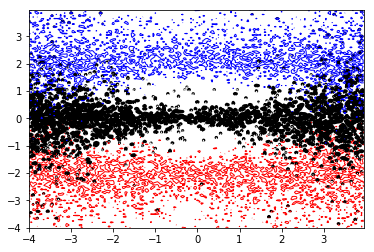

In [242]:
pylab.show()